<a href="https://colab.research.google.com/github/Arabasma/ML-and-NLP-Projects/blob/main/Comparaison_AppSup_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dataset Classic4



## Importation du dataset

In [ ]:
import pandas as pd
import numpy as np
import warnings

In [ ]:
#classic4
url='https://drive.google.com/file/d/1fMeNQm4fF1NpgTe2WVO3kQP16p_N6fYw/view'
url2='https://drive.google.com/uc?id=' + url.split('/')[-2]
classic4 = pd.read_csv(url2)

texts = classic4['text'].values
labels = classic4['label'].values
k=4

In [ ]:
len(texts)

7095

## Representation textuelle

### BERT

In [ ]:
!pip install transformers

In [ ]:
def collate_fn(batch_sentences, tokenizer):#recopier à partir de utils
    tokenized = tokenizer(batch_sentences, padding=True, truncation=True, max_length=512)
    inds = tokenized['input_ids']
    mask = tokenized['attention_mask']

    inds = torch.tensor(inds)
    mask = torch.tensor(mask)

    return inds, mask

def encode_sentences_batch(model, tokenizer, sentences, batch_size=32):
    n_layers = model.config.num_hidden_layers
    tokenized_sentences = [tokenizer.tokenize(sent)[:512] for sent in sentences]

    # sort by length
    argsort = np.argsort([len(i) for i in tokenized_sentences])
    sorted_inds = np.argsort(argsort)

    sentences = [sentences[i] for i in argsort]

    # sentences_dataset = BertDataset(sentences)
    data_loader = DataLoader(dataset=sentences,
                                batch_size=batch_size,
                                shuffle=False,
                                num_workers=4,
                                collate_fn=lambda x: collate_fn(x, tokenizer)
                                )

    embeddings = {k:[] for k in range(n_layers)}
    for _, batch in enumerate(data_loader):
        with torch.no_grad():
            x, mask = batch
            x = x.to(device)

            output = model(x)
            hidden_states = output.hidden_states
            hidden_states = list(hidden_states[1:])

            for ind_layer, layer_embeddings in enumerate(hidden_states):
                # remove padding's zeros
                layer_embeddings = layer_embeddings.cpu() * mask[:, :, None]
                # compute average over tokens
                layer_hidden_state = layer_embeddings.mean(axis=1)

                embeddings[ind_layer].append(layer_hidden_state)

    # put the batches together and sort the documents
    embeddings = [torch.vstack(embeddings[layer_ind])[sorted_inds].numpy() for layer_ind in range(n_layers)]

    return embeddings

In [ ]:
import transformers
from transformers import BertModel, BertTokenizer, RobertaModel, RobertaTokenizer
from torch.utils.data import DataLoader
import torch

In [ ]:
if torch.cuda.is_available():
  device='cuda'
else:
  device='cpu'

In [ ]:
model_name='bert-base-cased'
model=BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer=BertTokenizer.from_pretrained(model_name)

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
if device=='cuda':
  model.cuda()

In [ ]:
bert_embeddings=encode_sentences_batch(model, tokenizer, texts, batch_size=32)

In [ ]:
#Concaténation
bert_embeddings_concat=np.concatenate(bert_embeddings, axis=1)
bert_embeddings_concat.shape

(7095, 9216)

In [ ]:
#Moyenne
bert_embeddings_avg=np.mean(bert_embeddings, axis=0)
bert_embeddings_avg.shape

(7095, 768)

### RoBERTa

In [ ]:
model_name='roberta-base'
model=RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer=RobertaTokenizer.from_pretrained(model_name)

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
if device=='cuda':
  model.cuda()

In [ ]:
roberta_embeddings=encode_sentences_batch(model, tokenizer, texts, batch_size=32)

In [ ]:
#Concaténation
roberta_embeddings_concat=np.concatenate(roberta_embeddings, axis=1)
roberta_embeddings_concat.shape

(7095, 9216)

In [ ]:
#Moyenne
roberta_embeddings_avg=np.mean(roberta_embeddings, axis=0)
roberta_embeddings_avg.shape

(7095, 768)

## Clustering sur les données d'origine

In [ ]:
!pip install hdbscan

     |████████████████████████████████| 6.4 MB 4.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311918 sha256=5099759aa7fbde222ca5ed2ec4d5ce23c94887fed016381e4cd97577a1050d98
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan


In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
import  hdbscan
from sklearn.cluster import AgglomerativeClustering

import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

In [ ]:
#Define an accuracy function

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)


def accuracy(true_row_labels, predicted_row_labels):
    """Get the best accuracy.

    Parameters
    ----------
    true_row_labels: array-like
        The true row labels, given as external information
    predicted_row_labels: array-like
        The row labels predicted by the model

    Returns
    -------
    float
        Best value of accuracy
    """

    cm = confusion_matrix(true_row_labels, predicted_row_labels)
    indexes = linear_sum_assignment(_make_cost_m(cm))
    total = 0
    for row, column in zip(*indexes):
        value = cm[row][column]
        total += value

    return round(total * 1. / np.sum(cm),2)

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
#Encode labels
from sklearn import preprocessing

le = preprocessing.LabelEncoder()
le.fit(labels)
labels_int= le.transform(labels)

In [ ]:
def eval_clustering_7(X_reduced, labels, model1, model2, model3, model4, model5, model6, model7, title0, title1, title2, title3, title4,
                      title5, title6,title7):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=labels, cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title0)

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1 +"\n NMI "+str(model1["NMI"])+"\n ARI "+str(model1["ARI"])+"\n accuracy "+str(model1["accuracy"]))

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model2["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title2+ "\n NMI "+str(model2["NMI"])+"\n ARI "+str(model2["ARI"])+"\n accuracy "+str(model2["accuracy"]))

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model3["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title3+"\n NMI "+str(model3["NMI"])+"\n ARI "+str(model3["ARI"])+"\n accuracy "+str(model3["accuracy"]))

    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model4["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title4 +"\n NMI "+str(model4["NMI"])+"\n ARI "+str(model4["ARI"])+"\n accuracy "+str(model4["accuracy"]))

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model5["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title5 +"\n NMI "+str(model5["NMI"])+"\n ARI "+str(model5["ARI"])+"\n accuracy "+str(model5["accuracy"]))

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model6["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title6+ "\n NMI "+str(model6["NMI"])+"\n ARI "+str(model6["ARI"])+"\n accuracy "+str(model6["accuracy"]))

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model7["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title7+"\n NMI "+str(model7["NMI"])+"\n ARI "+str(model7["ARI"])+"\n accuracy "+str(model7["accuracy"]))

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

In [ ]:
#PCA for visualisation
X_reduced=PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)

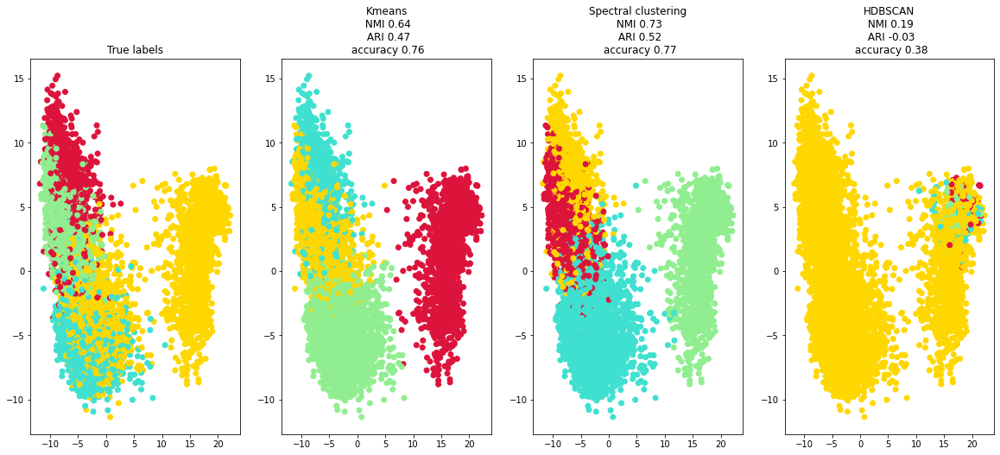

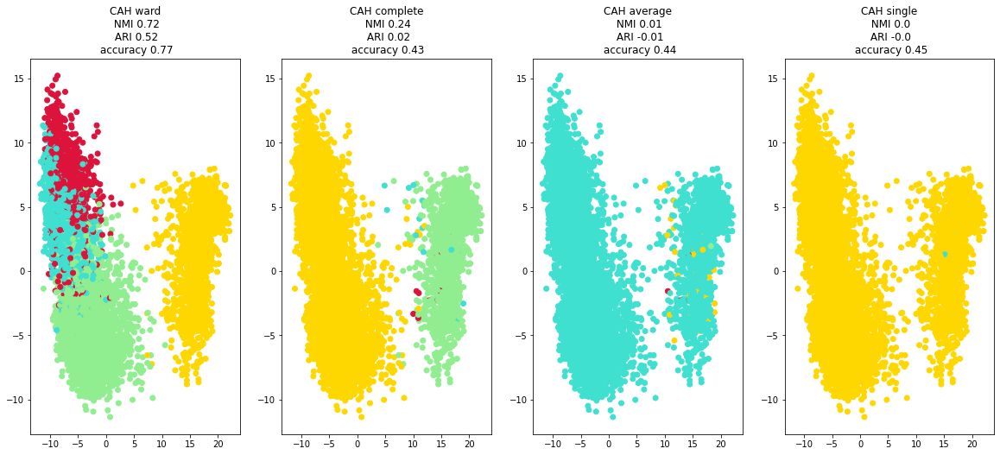

In [ ]:
eval_clustering_7(X_reduced, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

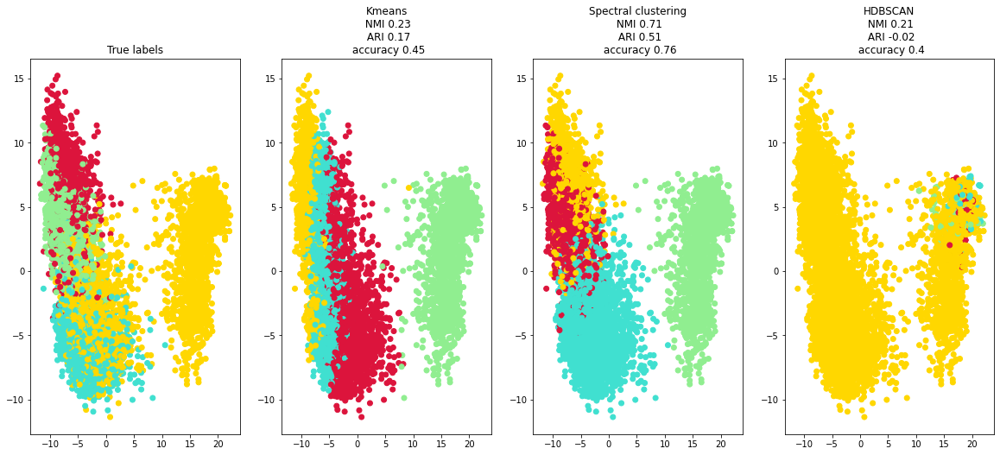

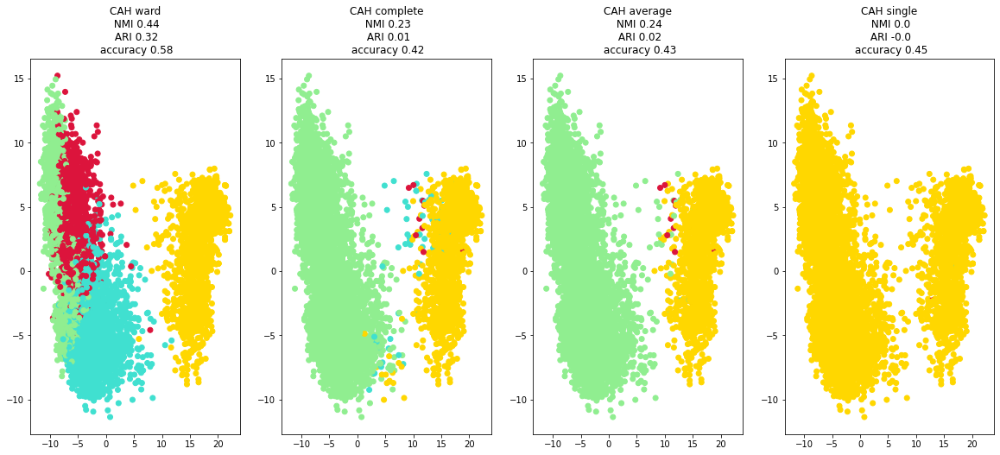

In [ ]:
eval_clustering_7(X_reduced, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Clustering sur les données reduites : Tandem

In [ ]:
!pip install umap.learn

     |████████████████████████████████| 86 kB 2.3 MB/s 
     |████████████████████████████████| 1.1 MB 4.7 MB/s 
  Created wheel for umap.learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=05276686b993170f76544d66b358f7ab51cb64de1110c5a2a970a3e7b4a6340a
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=be78d6edca2e70e0586d388508a904a8eec7b691e3c1fb42eb7e02f4b0bf08f5
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap.learn pynndescent


In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from torch.utils.data import DataLoader
import torch
from tqdm import tqdm

In [ ]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim
        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.embedding_dim)
        )

        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.input_dim),
            torch.nn.Sigmoid()
        )
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'
    if seed is not None:
      torch.manual_seed(seed)
    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)
    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)

          loss = loss_function(reconstructed, batch)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
100%|██████████| 50/50 [00:16<00:00,  3.03it/s]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

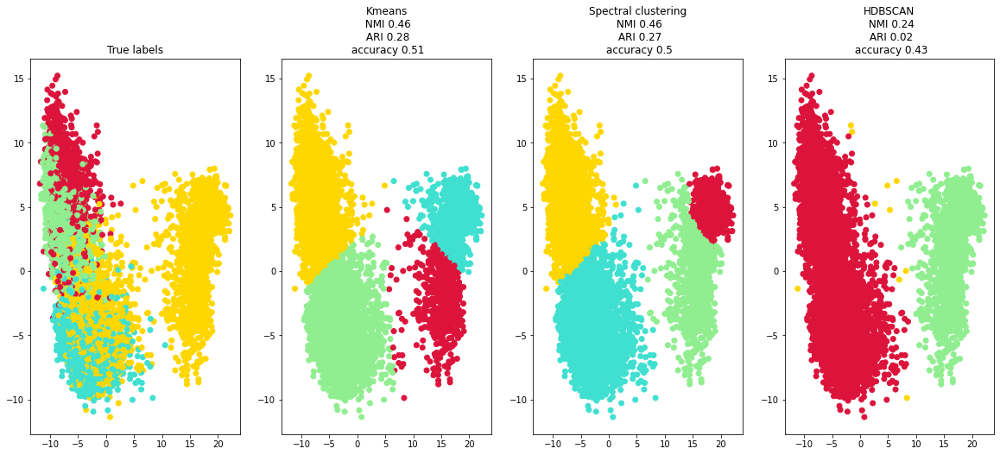

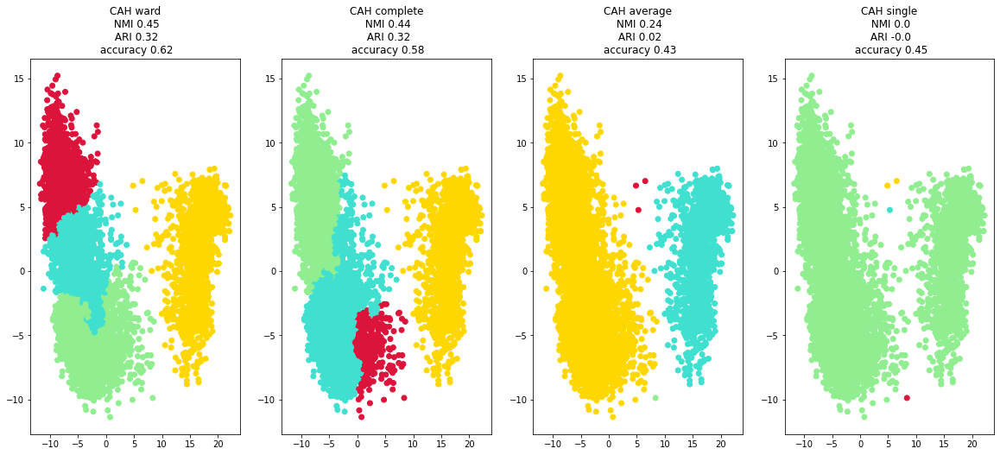

In [ ]:
eval_clustering_7(X_reduced_PCA, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

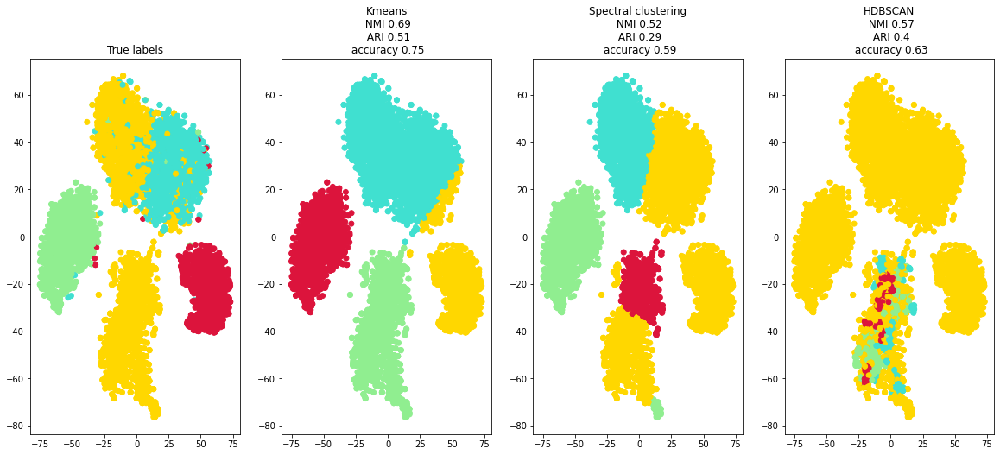

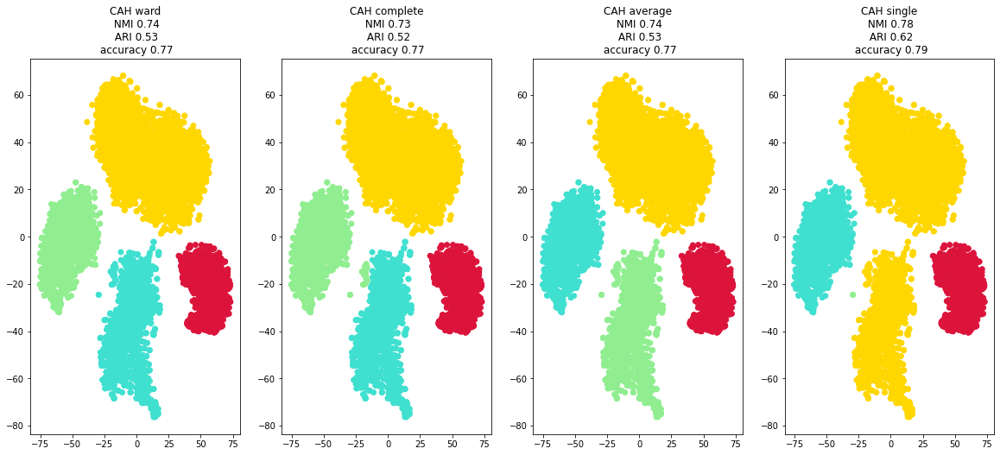

In [ ]:
eval_clustering_7(X_reduced_TSNE, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

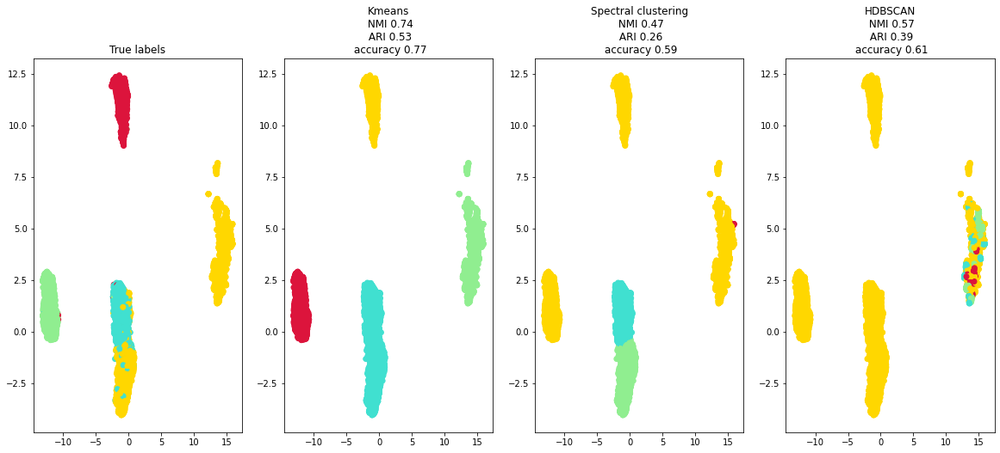

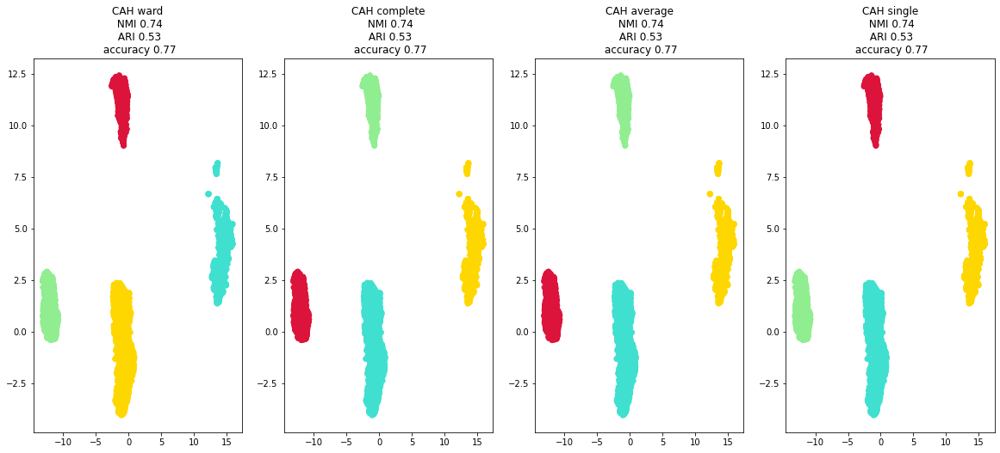

In [ ]:
eval_clustering_7(X_reduced_UMAP, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

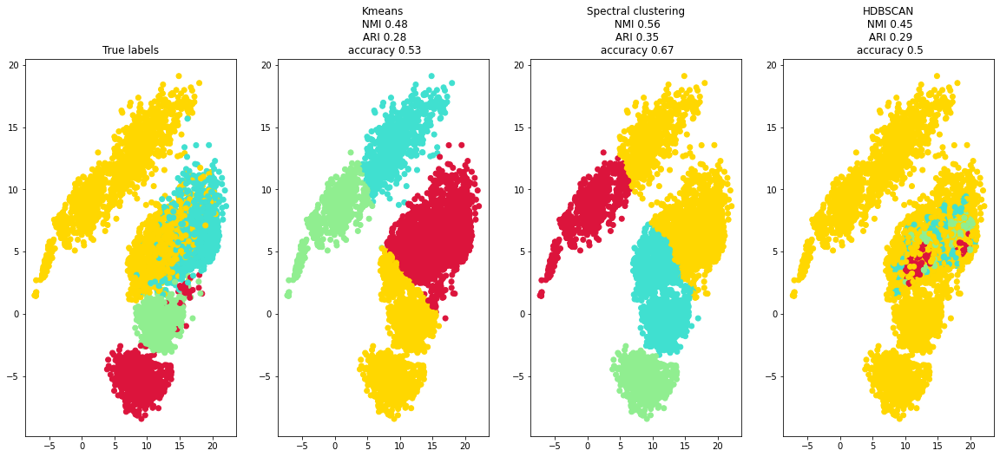

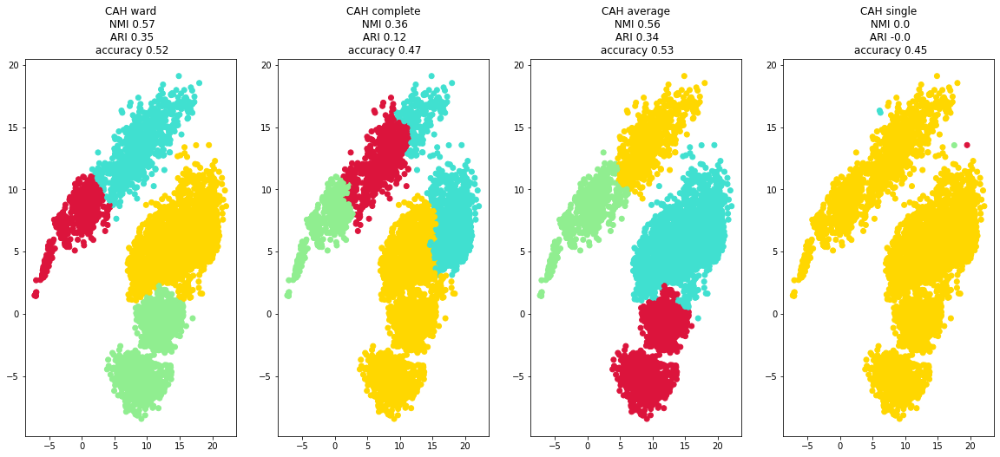

In [ ]:
eval_clustering_7(X_reduced_autoencoder, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [00:16<00:00,  3.03it/s]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

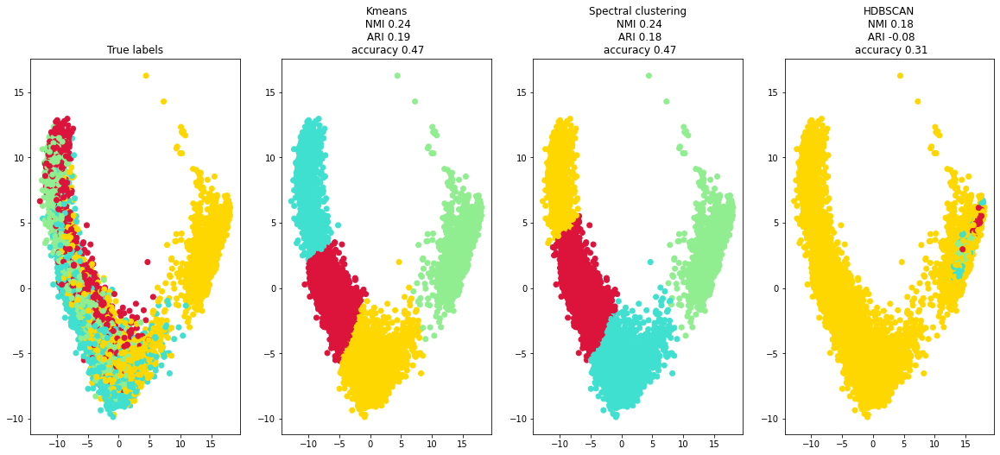

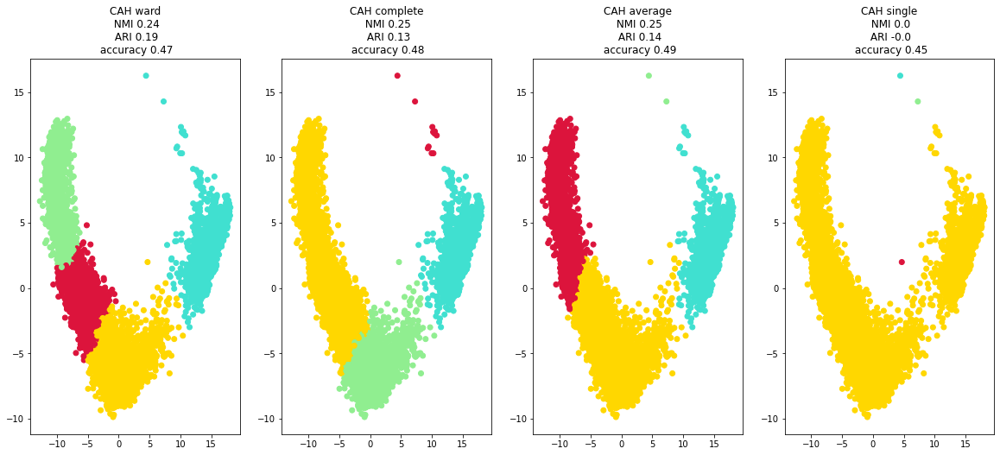

In [ ]:
eval_clustering_7(X_reduced_PCA, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

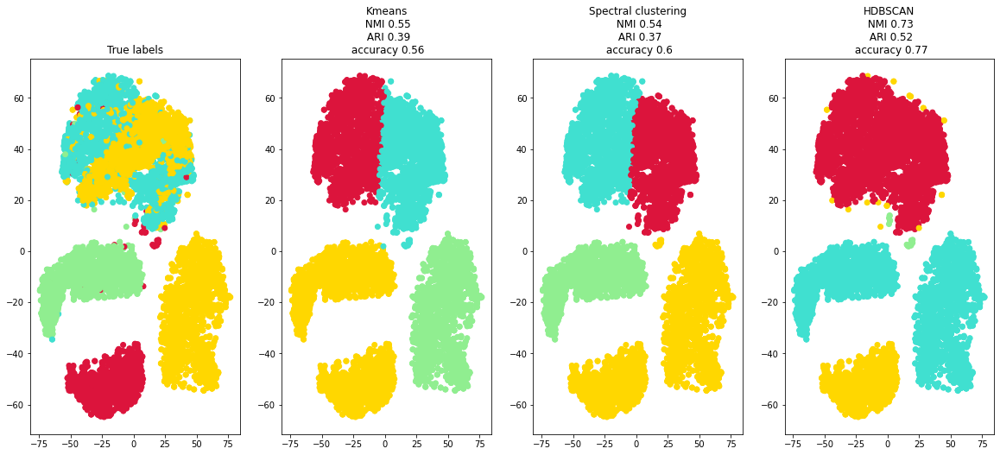

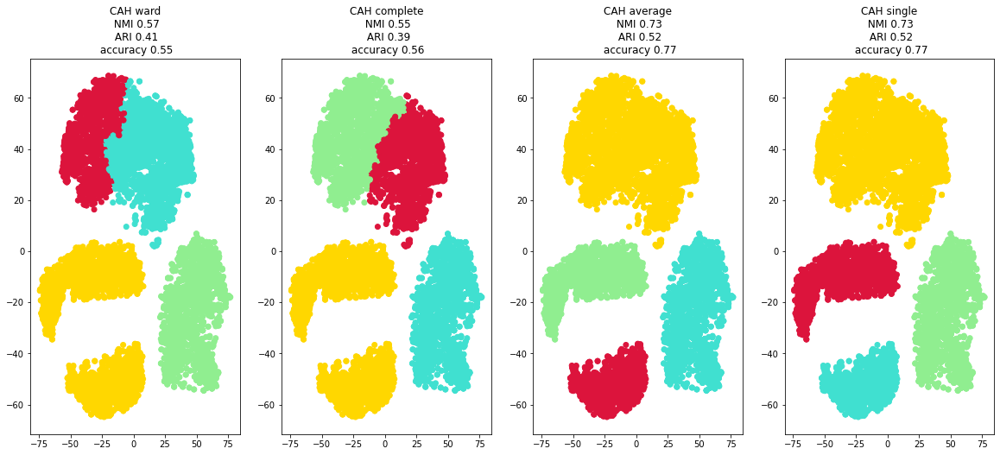

In [ ]:
eval_clustering_7(X_reduced_TSNE, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

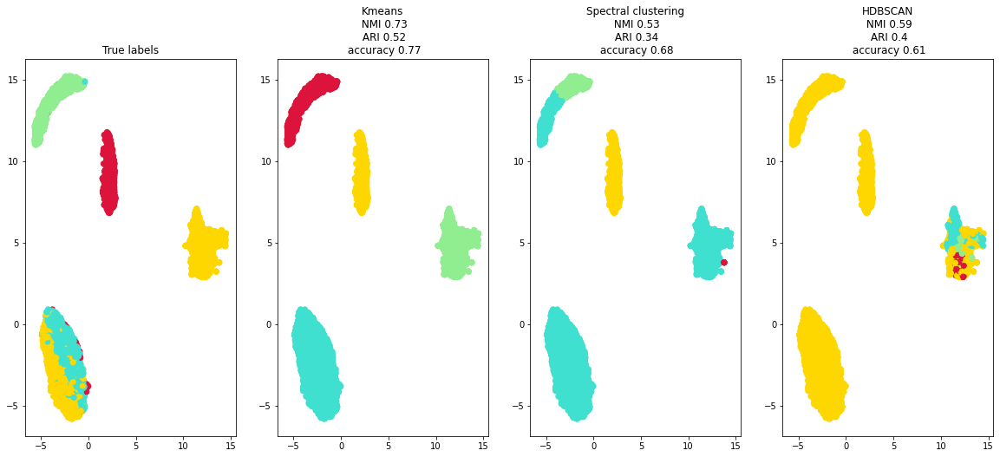

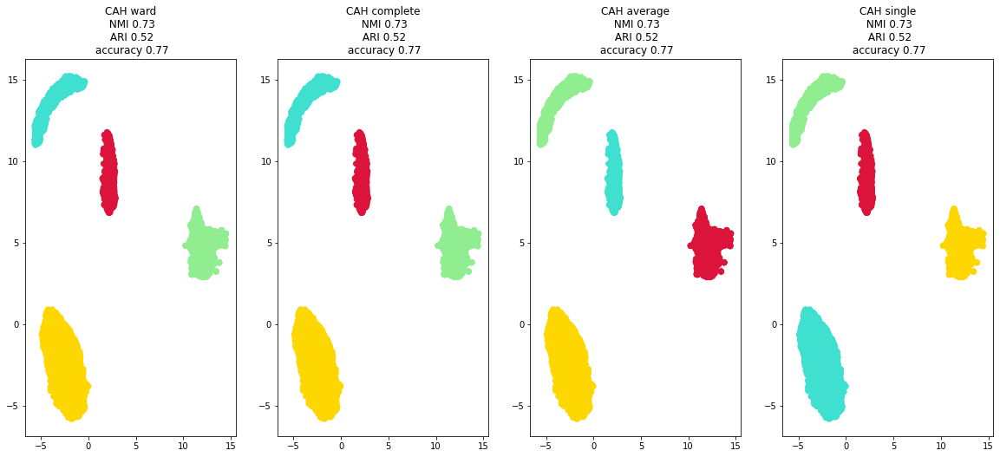

In [ ]:
eval_clustering_7(X_reduced_UMAP, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

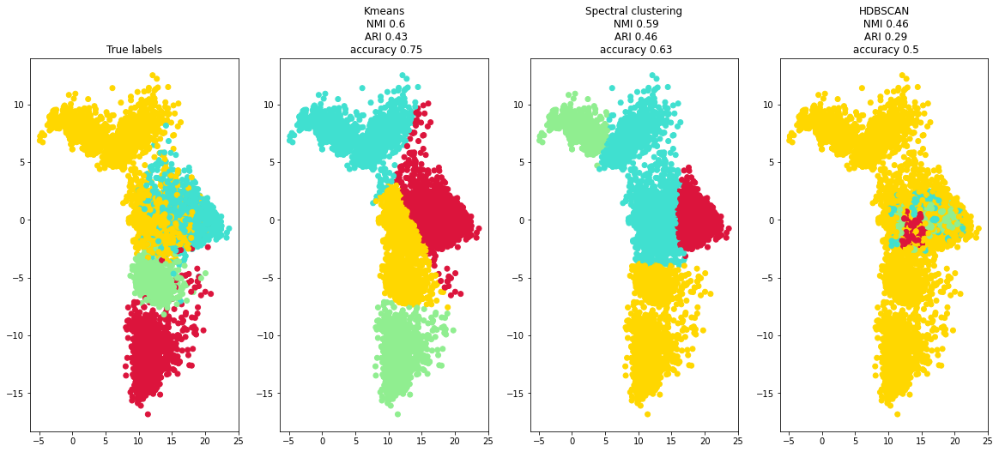

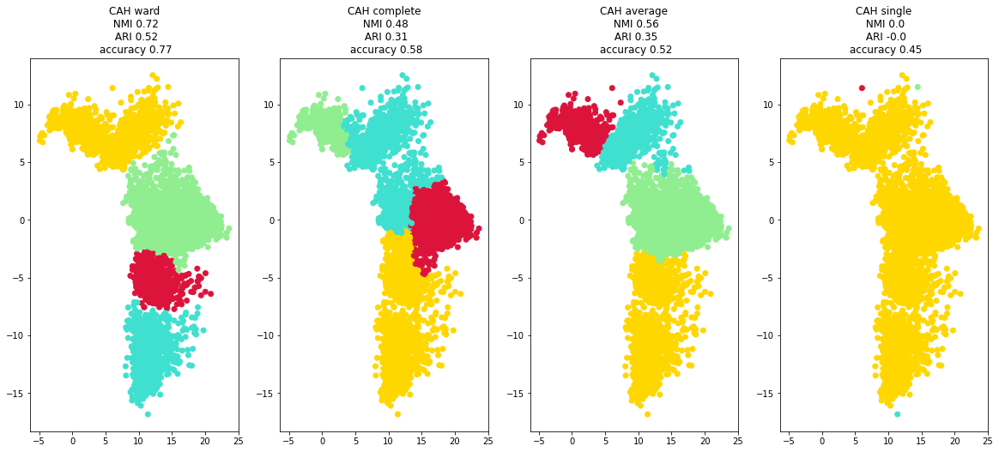

In [ ]:
eval_clustering_7(X_reduced_autoencoder, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Méthodes combinées

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
!pip install rpy2

In [ ]:
import rpy2.robjects.numpy2ri
rpy2.robjects.numpy2ri.activate()

In [ ]:
from rpy2.robjects.packages import importr
utils= importr('utils')

In [ ]:
utils.install_packages('FCPS', repos="https://cloud.r-project.org")

In [ ]:
fcps=importr('FCPS')

In [ ]:
utils.install_packages('clustrd')

In [ ]:
def eval_clustering_2(X_reduced, labels, model1,  title0, title1):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,2,figsize=(20,8))

    plt.subplot(1, 2, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=labels, cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title0)

    plt.subplot(1, 2, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1 +"\n NMI "+str(model1["NMI"])+"\n ARI "+str(model1["ARI"])+"\n accuracy "+str(model1["accuracy"]))

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(rkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(rkm_pred_labels, labels_int),2),
          "accuracy": accuracy(rkm_pred_labels, labels_int)}

  |======================================================================| 100%

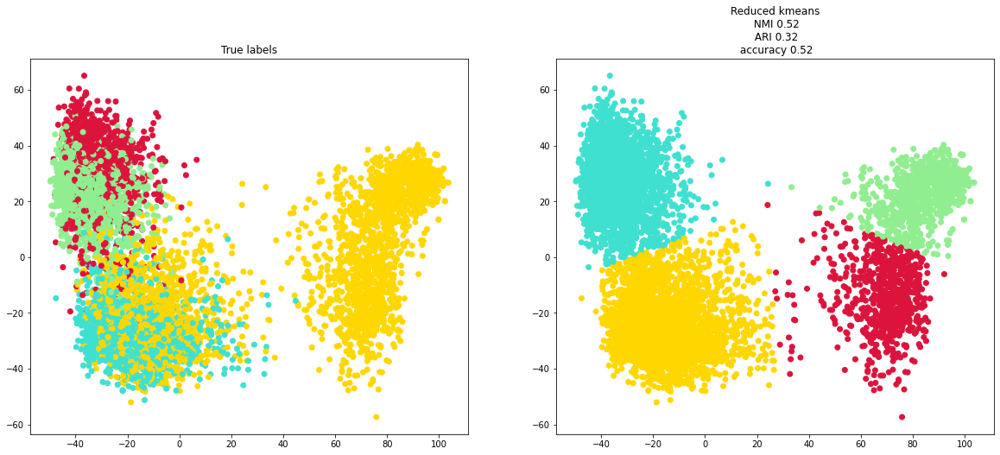

In [ ]:
eval_clustering_2(X_reduced_rkm, labels_int ,rkm, "True labels","Reduced kmeans")

> #### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(fkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(fkm_pred_labels, labels_int),2),
          "accuracy": accuracy(fkm_pred_labels, labels_int)}

  |======================================================================| 100%

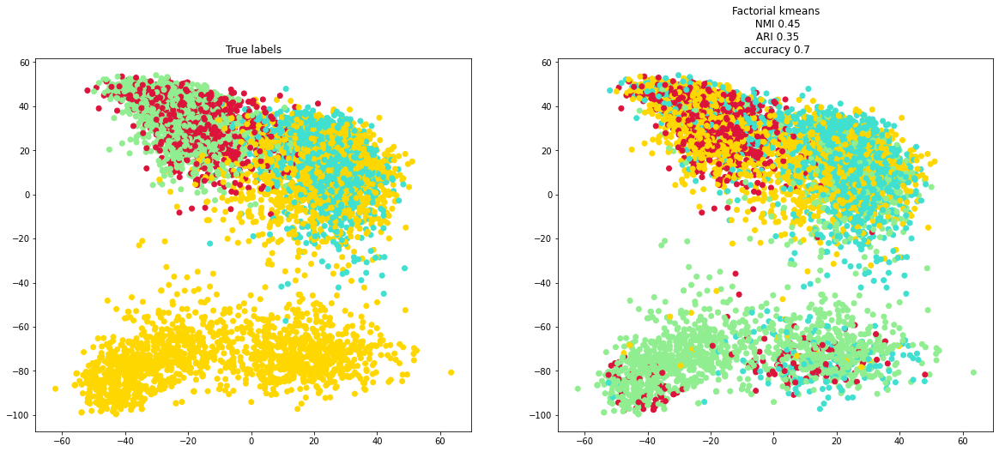

In [ ]:
eval_clustering_2(X_reduced_fkm, labels_int ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
import os
import math
import tensorflow.compat.v1 as tf
from tqdm import tqdm

In [ ]:
"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})

        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]

    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels,
          "NMI": round(normalized_mutual_info_score(dcn_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(dcn_pred_labels, labels_int),2),
          "accuracy": accuracy(dcn_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:13<00:00,  3.71it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:39<00:00,  1.27it/s]


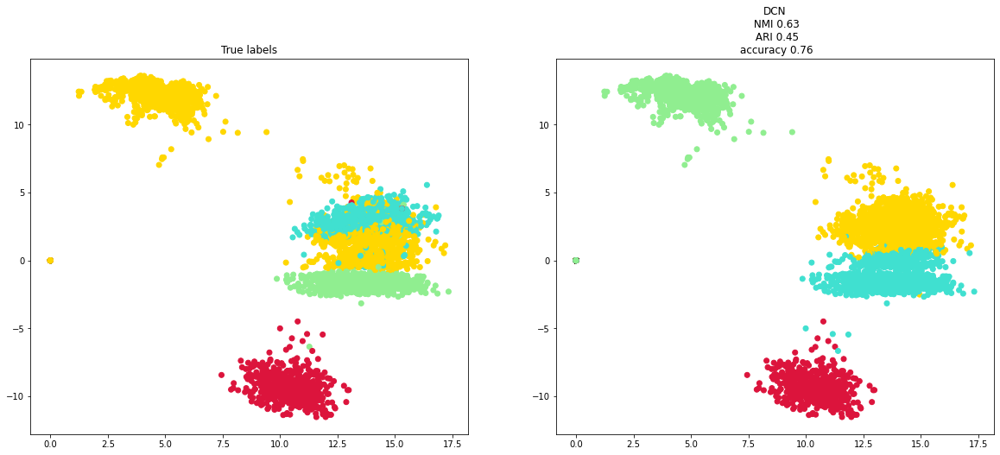

In [ ]:
eval_clustering_2(X_reduced_dcn, labels_int ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(dkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(dkm_pred_labels, labels_int),2),
          "accuracy": accuracy(dkm_pred_labels, labels_int)}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:13<00:00,  3.68it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:31<00:00,  1.59s/it]


ResourceExhaustedError: ignored

In [ ]:
eval_clustering_2(X_reduced_dkm, labels_int ,dkm, "True labels","DKM")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(rkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(rkm_pred_labels, labels_int),2),
          "accuracy": accuracy(rkm_pred_labels, labels_int)}

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



  |======================================================================| 100%

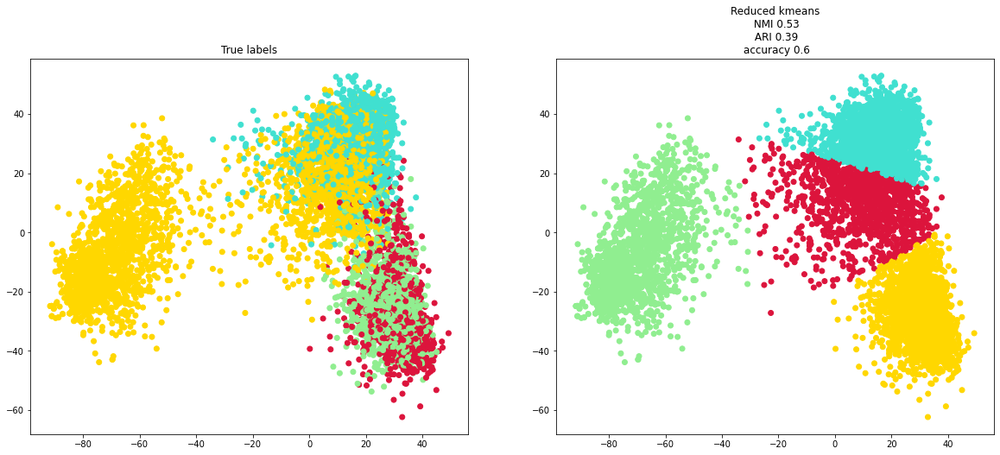

In [ ]:
eval_clustering_2(X_reduced_rkm, labels_int ,rkm, "True labels","Reduced kmeans")

>#### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(fkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(fkm_pred_labels, labels_int),2),
          "accuracy": accuracy(fkm_pred_labels, labels_int)}

  |======================================================================| 100%

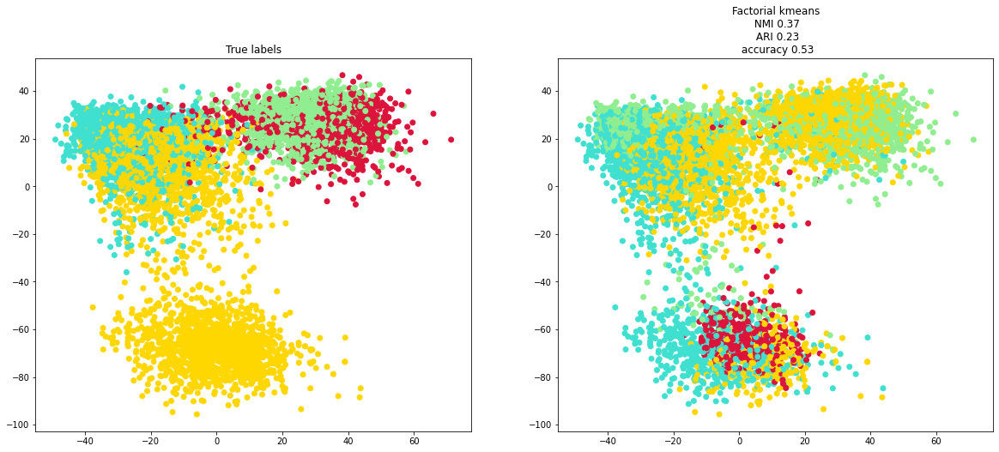

In [ ]:
eval_clustering_2(X_reduced_fkm, labels_int ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels,
          "NMI": round(normalized_mutual_info_score(dcn_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(dcn_pred_labels, labels_int),2),
          "accuracy": accuracy(dcn_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:14<00:00,  3.36it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:38<00:00,  1.31it/s]


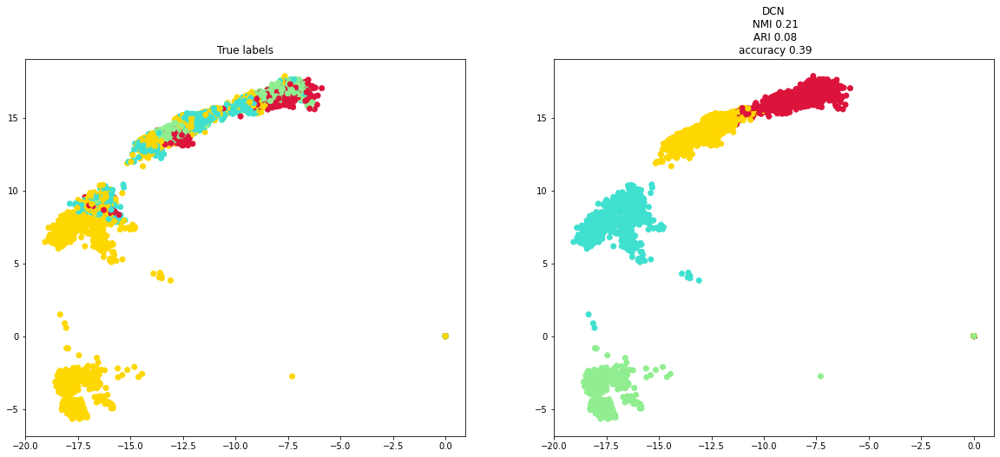

In [ ]:
eval_clustering_2(X_reduced_dcn, labels_int ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(dkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(dkm_pred_labels, labels_int),2),
          "accuracy": accuracy(dkm_pred_labels, labels_int)}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:13<00:00,  3.59it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:31<00:00,  1.56s/it]


ResourceExhaustedError: ignored

In [ ]:
eval_clustering_2(X_reduced_dkm, labels_int ,dkm, "True labels","DKM")

# Dataset BBC



## Importation du dataset

In [ ]:
import pandas as pd
import numpy as np
import warnings

In [ ]:
#classic4
url='https://drive.google.com/file/d/1vK6cG924aVxeVL7di_xfGHibL7TwNsjg/view'
url2='https://drive.google.com/uc?id=' + url.split('/')[-2]
classic4 = pd.read_csv(url2)

texts = classic4['text'].values
labels = classic4['label'].values
k=5

In [ ]:
len(texts)

2225

## Representation textuelle

### BERT

In [ ]:
!pip install transformers

     |████████████████████████████████| 3.3 MB 9.4 MB/s 
     |████████████████████████████████| 61 kB 538 kB/s 
     |████████████████████████████████| 596 kB 54.1 MB/s 
     |████████████████████████████████| 895 kB 70.7 MB/s 
     |████████████████████████████████| 3.3 MB 46.4 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
def collate_fn(batch_sentences, tokenizer):#recopier à partir de utils
    tokenized = tokenizer(batch_sentences, padding=True, truncation=True, max_length=512)
    inds = tokenized['input_ids']
    mask = tokenized['attention_mask']

    inds = torch.tensor(inds)
    mask = torch.tensor(mask)

    return inds, mask

def encode_sentences_batch(model, tokenizer, sentences, batch_size=32):
    n_layers = model.config.num_hidden_layers
    tokenized_sentences = [tokenizer.tokenize(sent)[:512] for sent in sentences]

    # sort by length
    argsort = np.argsort([len(i) for i in tokenized_sentences])
    sorted_inds = np.argsort(argsort)

    sentences = [sentences[i] for i in argsort]

    # sentences_dataset = BertDataset(sentences)
    data_loader = DataLoader(dataset=sentences,
                                batch_size=batch_size,
                                shuffle=False,
                                num_workers=4,
                                collate_fn=lambda x: collate_fn(x, tokenizer)
                                )

    embeddings = {k:[] for k in range(n_layers)}
    for _, batch in enumerate(data_loader):
        with torch.no_grad():
            x, mask = batch
            x = x.to(device)

            output = model(x)
            hidden_states = output.hidden_states
            hidden_states = list(hidden_states[1:])

            for ind_layer, layer_embeddings in enumerate(hidden_states):
                # remove padding's zeros
                layer_embeddings = layer_embeddings.cpu() * mask[:, :, None]
                # compute average over tokens
                layer_hidden_state = layer_embeddings.mean(axis=1)

                embeddings[ind_layer].append(layer_hidden_state)

    # put the batches together and sort the documents
    embeddings = [torch.vstack(embeddings[layer_ind])[sorted_inds].numpy() for layer_ind in range(n_layers)]

    return embeddings

In [ ]:
import transformers
from transformers import BertModel, BertTokenizer, RobertaModel, RobertaTokenizer
from torch.utils.data import DataLoader
import torch

In [ ]:
if torch.cuda.is_available():
  device='cuda'
else:
  device='cpu'

In [ ]:
model_name='bert-base-cased'
model=BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer=BertTokenizer.from_pretrained(model_name)

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/416M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/208k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/426k [00:00<?, ?B/s]

In [ ]:
if device=='cuda':
  model.cuda()

In [ ]:
bert_embeddings=encode_sentences_batch(model, tokenizer, texts, batch_size=32)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
#Concaténation
bert_embeddings_concat=np.concatenate(bert_embeddings, axis=1)
bert_embeddings_concat.shape

(2225, 9216)

In [ ]:
#Moyenne
bert_embeddings_avg=np.mean(bert_embeddings, axis=0)
bert_embeddings_avg.shape

(2225, 768)

### RoBERTa

In [ ]:
model_name='roberta-base'
model=RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer=RobertaTokenizer.from_pretrained(model_name)

Downloading:   0%|          | 0.00/481 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/478M [00:00<?, ?B/s]

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.dense.bias', 'lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.decoder.weight', 'lm_head.bias', 'lm_head.dense.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

In [ ]:
if device=='cuda':
  model.cuda()

In [ ]:
roberta_embeddings=encode_sentences_batch(model, tokenizer, texts, batch_size=32)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
#Concaténation
roberta_embeddings_concat=np.concatenate(roberta_embeddings, axis=1)
roberta_embeddings_concat.shape

(2225, 9216)

In [ ]:
#Moyenne
roberta_embeddings_avg=np.mean(roberta_embeddings, axis=0)
roberta_embeddings_avg.shape

(2225, 768)

## Ecriture et lectures des représentations textuellles depuis des fichiers

In [ ]:
#Ecrire roberta dans un fichier
with open('roberta_embeddings.txt', 'w') as filehandle:
    for listitem in roberta_embeddings:
        filehandle.write('%s\n' % listitem)

In [ ]:
# Lire roberta depuis le fichier
roberta_embeddings_file = []

# open file and read the content in a list
with open('roberta_embeddings.txt', 'r') as filehandle:
    for line in filehandle:
        # remove linebreak which is the last character of the string
        currentPlace = line[:-1]

        # add item to the list
        roberta_embeddings_file.append(currentPlace)

In [ ]:
#Ecriture de bert dans un fichier
with open('bert_embeddings.txt', 'w') as filehandle:
    for listitem in bert_embeddings:
        filehandle.write('%s\n' % listitem)

In [ ]:
#Lecture de bert depuis le fichier
bert_embeddings_file = []

# open file and read the content in a list
with open('bert_embeddings.txt', 'r') as filehandle:
    for line in filehandle:
        # remove linebreak which is the last character of the string
        currentPlace = line[:-1]

        # add item to the list
        bert_embeddings_file.append(currentPlace)

## Clustering sur les données d'origine

In [ ]:
!pip install hdbscan

     |████████████████████████████████| 6.4 MB 5.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311843 sha256=389a24e5db233140044613113b59e8625c33b1dc4e4bd34669a4485b08df0bc1
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan


In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
import  hdbscan
from sklearn.cluster import AgglomerativeClustering

import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

In [ ]:
#Define an accuracy function

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)


def accuracy(true_row_labels, predicted_row_labels):
    """Get the best accuracy.

    Parameters
    ----------
    true_row_labels: array-like
        The true row labels, given as external information
    predicted_row_labels: array-like
        The row labels predicted by the model

    Returns
    -------
    float
        Best value of accuracy
    """

    cm = confusion_matrix(true_row_labels, predicted_row_labels)
    indexes = linear_sum_assignment(_make_cost_m(cm))
    total = 0
    for row, column in zip(*indexes):
        value = cm[row][column]
        total += value

    return round(total * 1. / np.sum(cm),2)

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
#Encode labels
from sklearn import preprocessing

le = preprocessing.LabelEncoder()
le.fit(labels)
labels_int= le.transform(labels)

In [ ]:
def eval_clustering_7(X_reduced, labels, model1, model2, model3, model4, model5, model6, model7, title0, title1, title2, title3, title4,
                      title5, title6,title7):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=labels, cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title0)

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1 +"\n NMI "+str(model1["NMI"])+"\n ARI "+str(model1["ARI"])+"\n accuracy "+str(model1["accuracy"]))

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model2["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title2+ "\n NMI "+str(model2["NMI"])+"\n ARI "+str(model2["ARI"])+"\n accuracy "+str(model2["accuracy"]))

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model3["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title3+"\n NMI "+str(model3["NMI"])+"\n ARI "+str(model3["ARI"])+"\n accuracy "+str(model3["accuracy"]))

    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model4["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title4 +"\n NMI "+str(model4["NMI"])+"\n ARI "+str(model4["ARI"])+"\n accuracy "+str(model4["accuracy"]))

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model5["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title5 +"\n NMI "+str(model5["NMI"])+"\n ARI "+str(model5["ARI"])+"\n accuracy "+str(model5["accuracy"]))

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model6["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title6+ "\n NMI "+str(model6["NMI"])+"\n ARI "+str(model6["ARI"])+"\n accuracy "+str(model6["accuracy"]))

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model7["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title7+"\n NMI "+str(model7["NMI"])+"\n ARI "+str(model7["ARI"])+"\n accuracy "+str(model7["accuracy"]))

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

In [ ]:
#PCA for visualisation
X_reduced=PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)

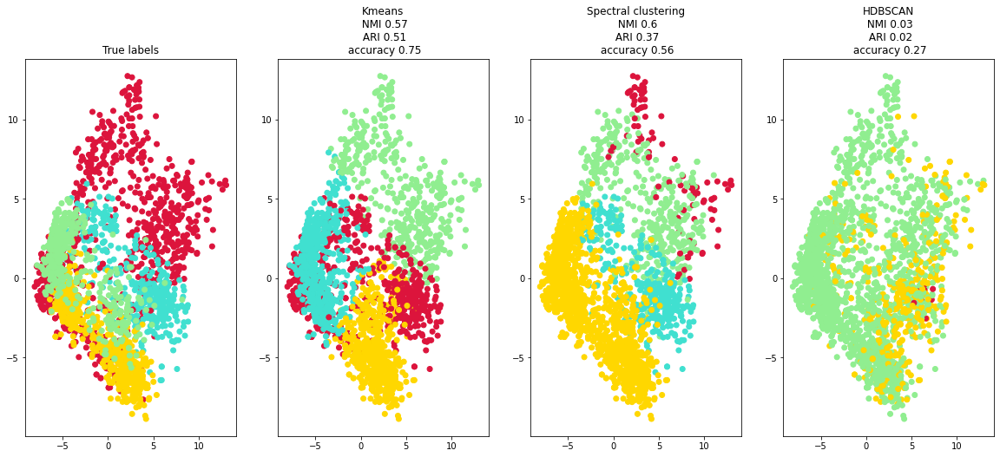

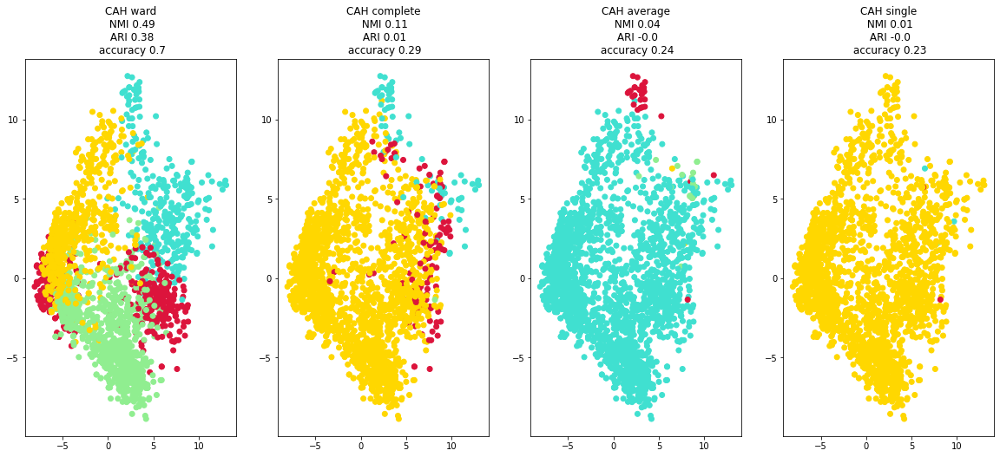

In [ ]:
eval_clustering_7(X_reduced, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

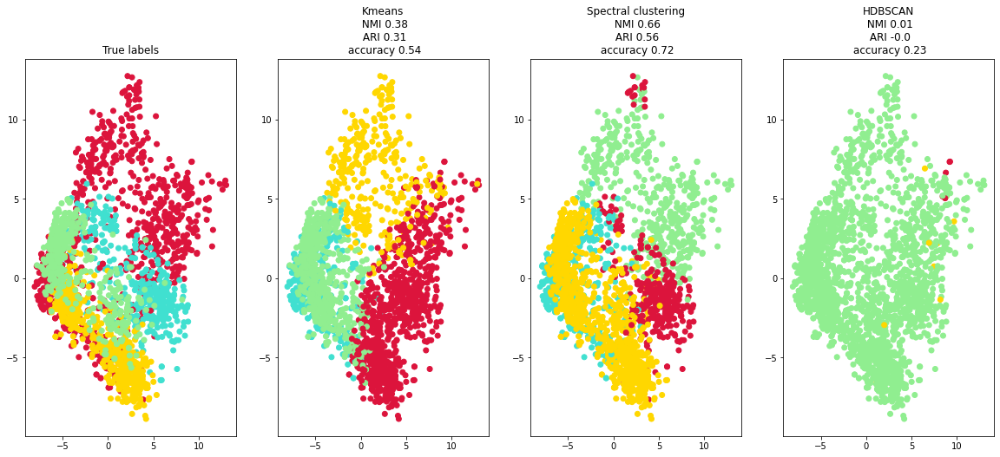

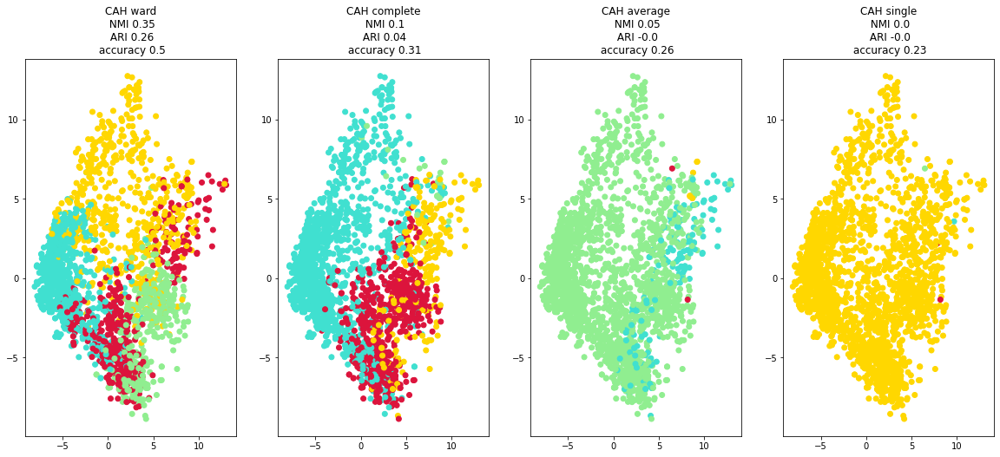

In [ ]:
eval_clustering_7(X_reduced, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Clustering sur les données reduites : Tandem

In [ ]:
!pip install umap.learn

     |████████████████████████████████| 86 kB 3.9 MB/s 
     |████████████████████████████████| 1.1 MB 25.6 MB/s 
  Created wheel for umap.learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=1e375911ea7b6c82bf6a0f284a9c2e2d39f4b133d8ef8653f9ab2c5d523cdb89
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=d39c0b8818aea474419b5111ae3e290a41e0ec5def028f2e97a8d53dd296c8ca
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap.learn pynndescent


In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from torch.utils.data import DataLoader
import torch
from tqdm import tqdm

In [ ]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim
        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.embedding_dim)
        )

        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.input_dim),
            torch.nn.Sigmoid()
        )
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'
    if seed is not None:
      torch.manual_seed(seed)
    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)
    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)

          loss = loss_function(reconstructed, batch)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
100%|██████████| 50/50 [01:10<00:00,  1.41s/it]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

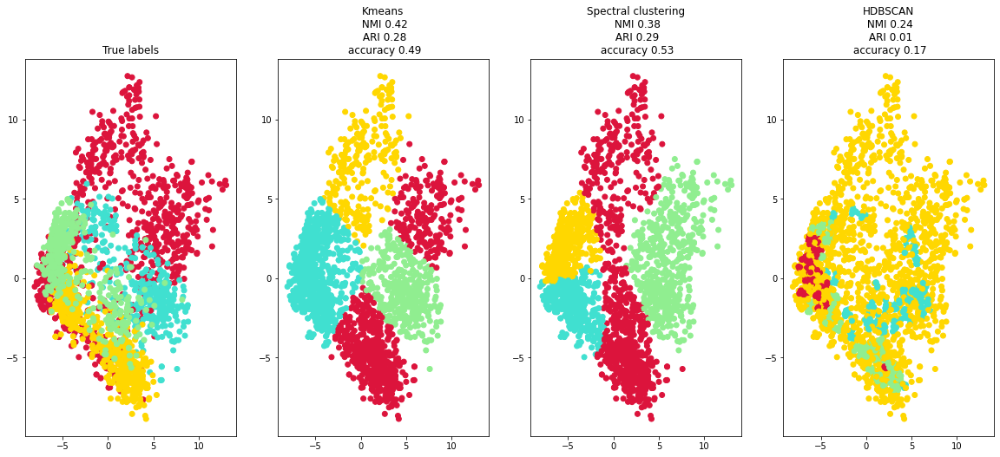

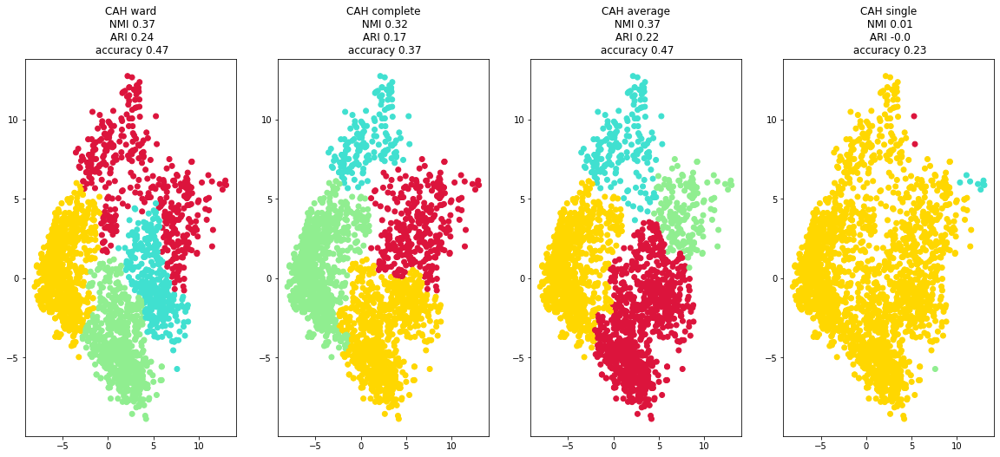

In [ ]:
eval_clustering_7(X_reduced_PCA, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

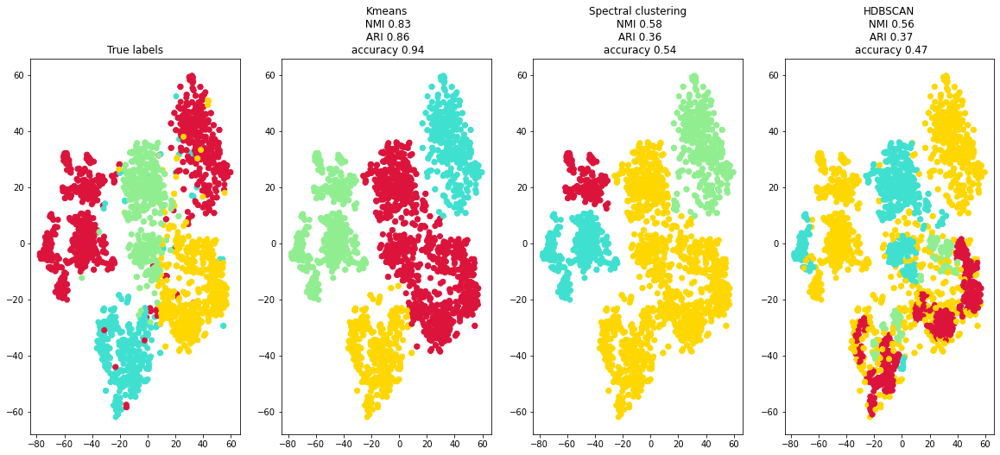

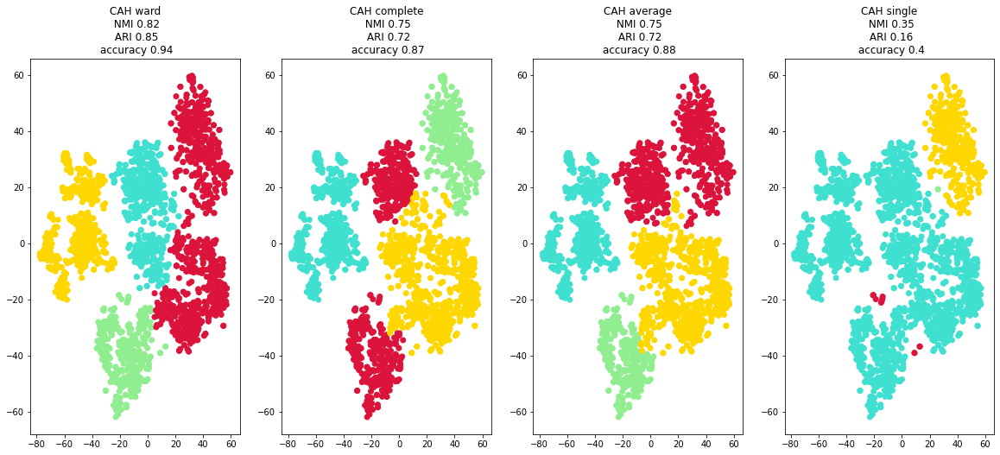

In [ ]:
eval_clustering_7(X_reduced_TSNE, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

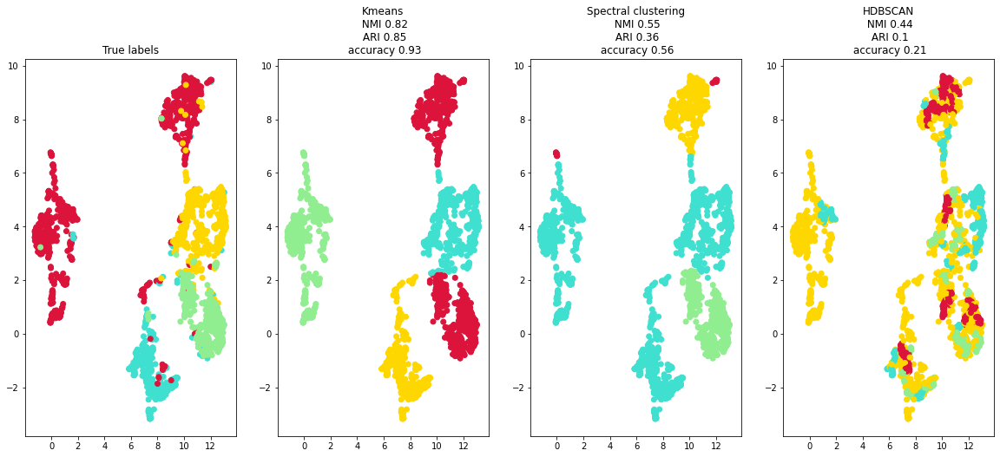

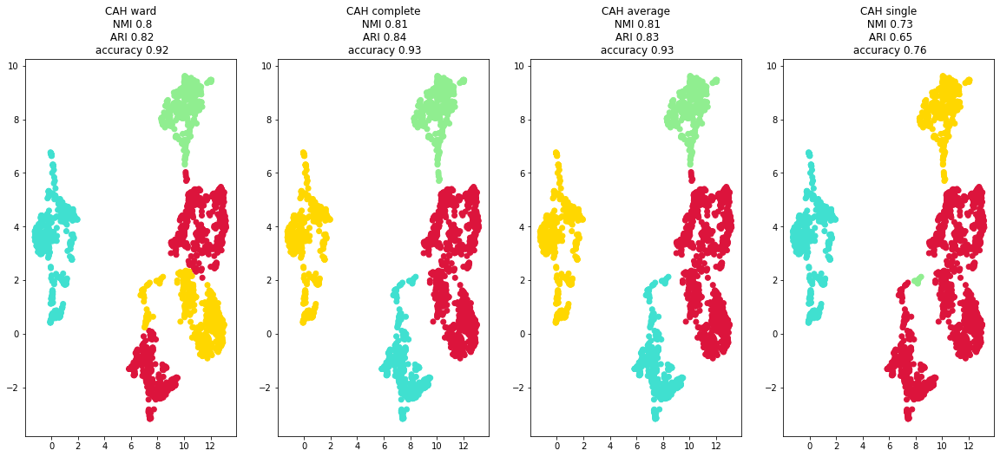

In [ ]:
eval_clustering_7(X_reduced_UMAP, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

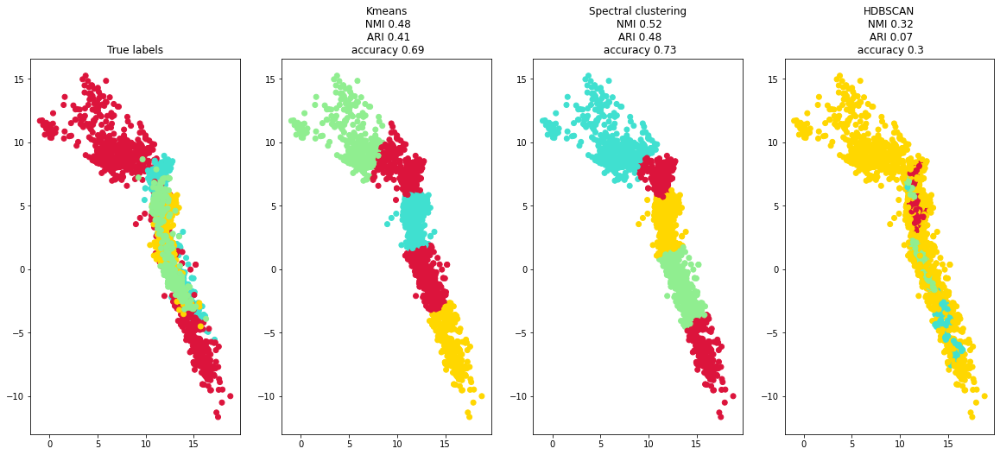

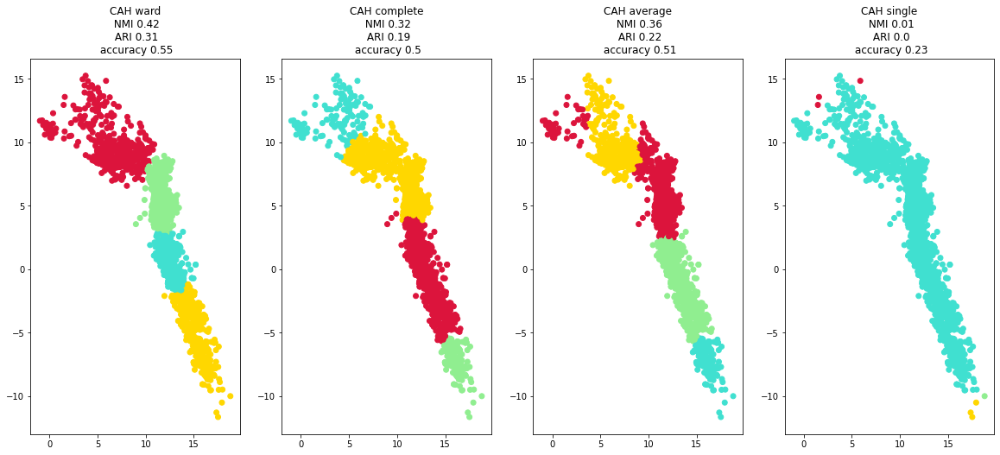

In [ ]:
eval_clustering_7(X_reduced_autoencoder, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [01:10<00:00,  1.42s/it]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

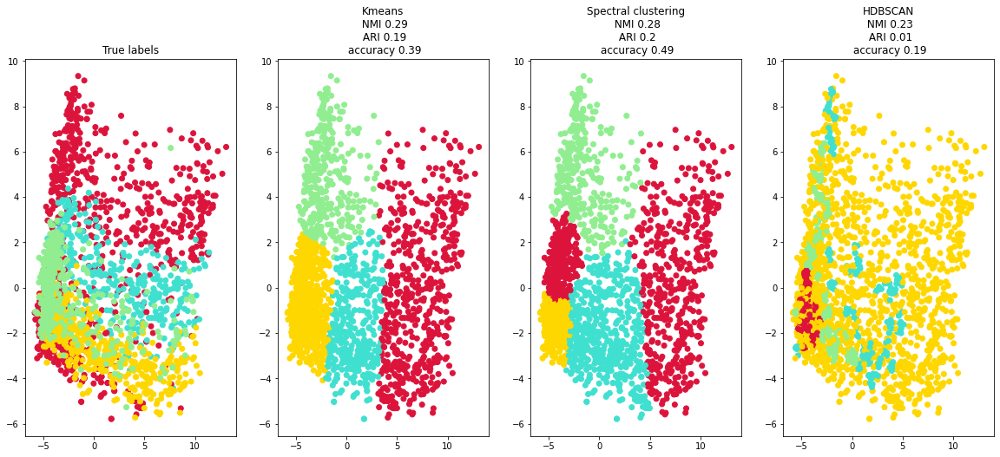

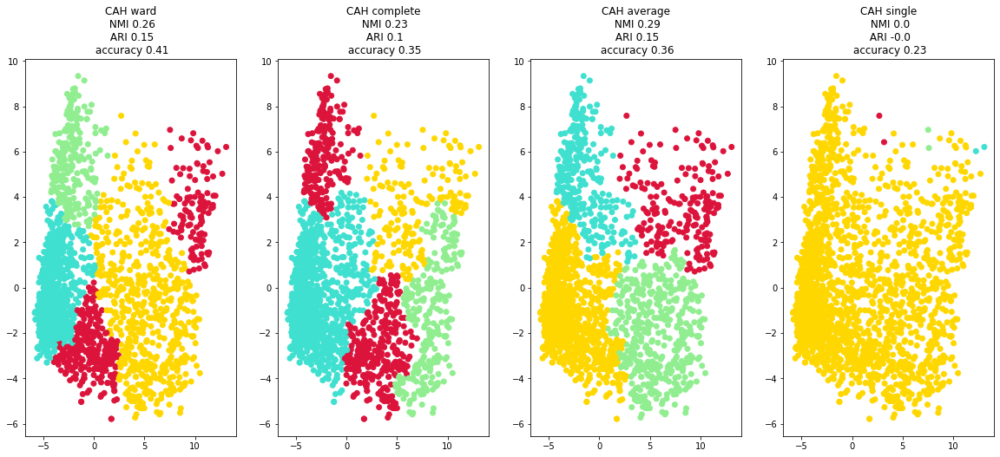

In [ ]:
eval_clustering_7(X_reduced_PCA, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

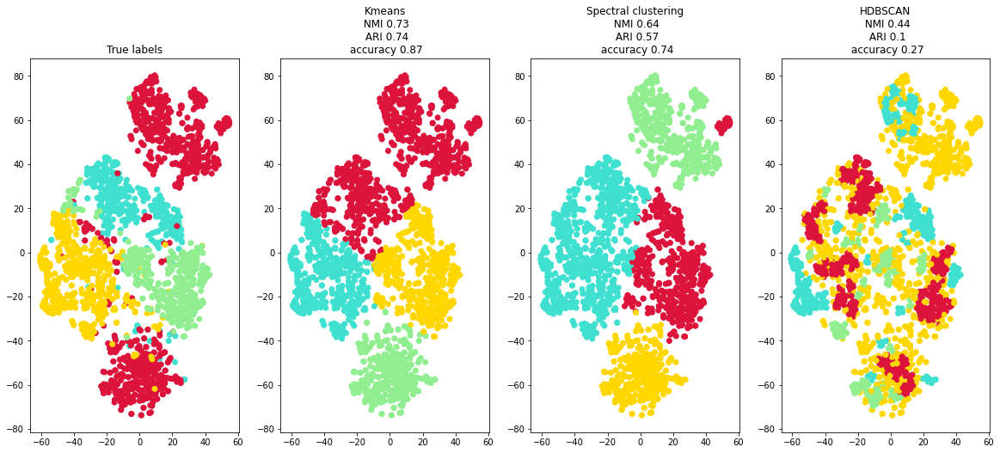

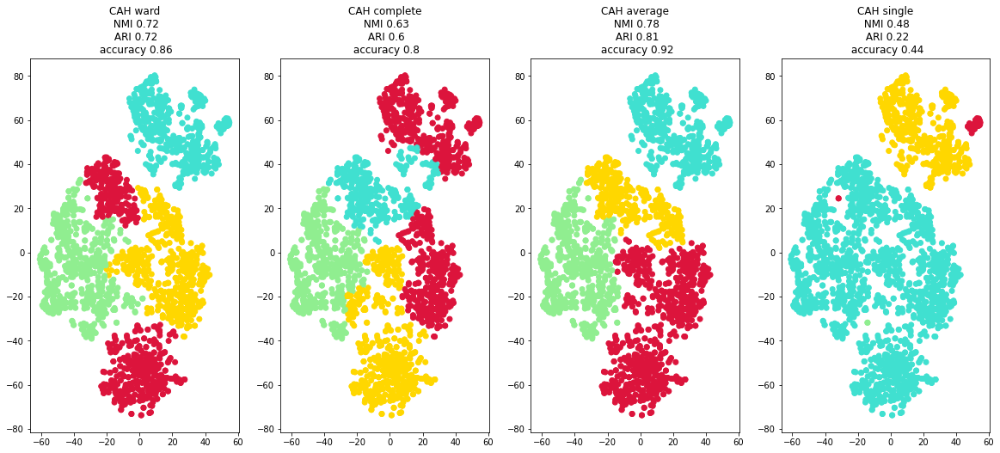

In [ ]:
eval_clustering_7(X_reduced_TSNE, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

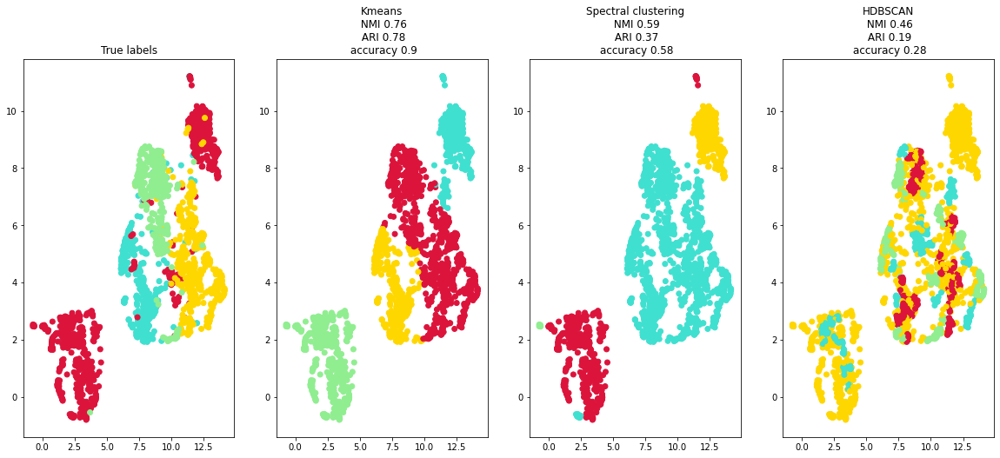

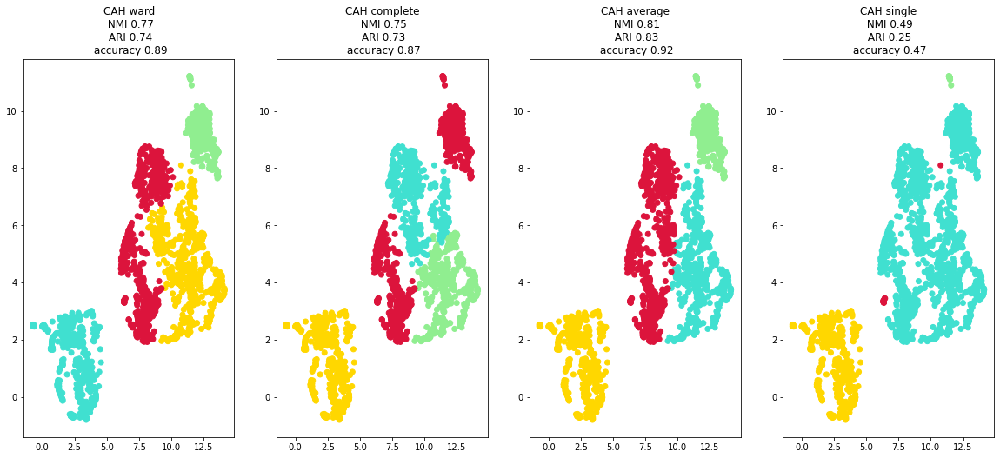

In [ ]:
eval_clustering_7(X_reduced_UMAP, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": round(adjusted_rand_score(kmeans_pred_labels, labels_int),2),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": round(adjusted_rand_score(sepectral_pred_labels, labels_int),2),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(hdbscan_pred_labels, labels_int),2),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_ward_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_complete_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_average_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(cah_single_pred_labels, labels_int),2),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

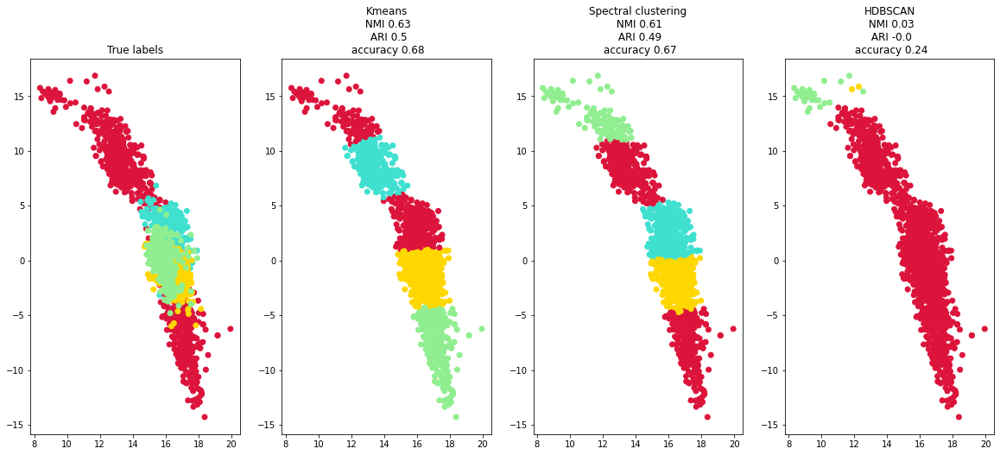

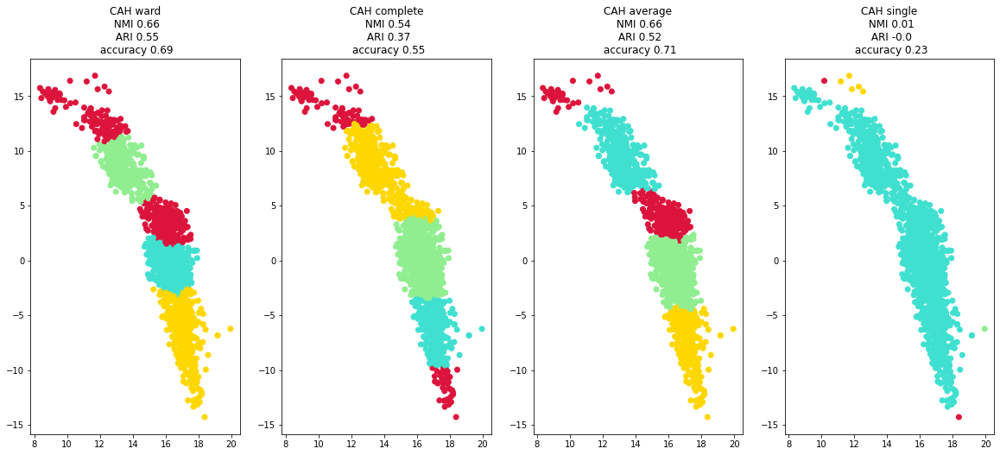

In [ ]:
eval_clustering_7(X_reduced_autoencoder, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Méthodes combinées

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
!pip install rpy2

In [ ]:
import rpy2.robjects.numpy2ri
rpy2.robjects.numpy2ri.activate()

In [ ]:
from rpy2.robjects.packages import importr
utils= importr('utils')

In [ ]:
utils.install_packages('FCPS', repos="https://cloud.r-project.org")

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘plyr’, ‘sp’, ‘pracma’, ‘reshape2’, ‘RcppArmadillo’, ‘mclust’, ‘DataVisualizations’


R[write to console]: trying URL 'https://cloud.r-project.org/src/contrib/plyr_1.8.6.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 401191 bytes (391 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[wr

<rpy2.rinterface_lib.sexp.NULLType object at 0x7ff27f0e0410> [RTYPES.NILSXP]

In [ ]:
fcps=importr('FCPS')

In [ ]:
utils.install_packages('clustrd')

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘RcppEigen’, ‘modeltools’, ‘DEoptimR’, ‘RSpectra’, ‘reshape’, ‘flexmix’, ‘prabclus’, ‘diptest’, ‘robustbase’, ‘kernlab’, ‘rARPACK’, ‘corpcor’, ‘GGally’, ‘fpc’, ‘ggrepel’, ‘ca’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/RcppEigen_0.3.3.9.1.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 1633360 bytes (1.6 MB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]:

<rpy2.rinterface_lib.sexp.NULLType object at 0x7ff27f0e0410> [RTYPES.NILSXP]

In [ ]:
def eval_clustering_2(X_reduced, labels, model1,  title0, title1):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,2,figsize=(20,8))

    plt.subplot(1, 2, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=labels, cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title0)

    plt.subplot(1, 2, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1 +"\n NMI "+str(model1["NMI"])+"\n ARI "+str(model1["ARI"])+"\n accuracy "+str(model1["accuracy"]))

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(rkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(rkm_pred_labels, labels_int),2),
          "accuracy": accuracy(rkm_pred_labels, labels_int)}

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



  |======================================================================| 100%

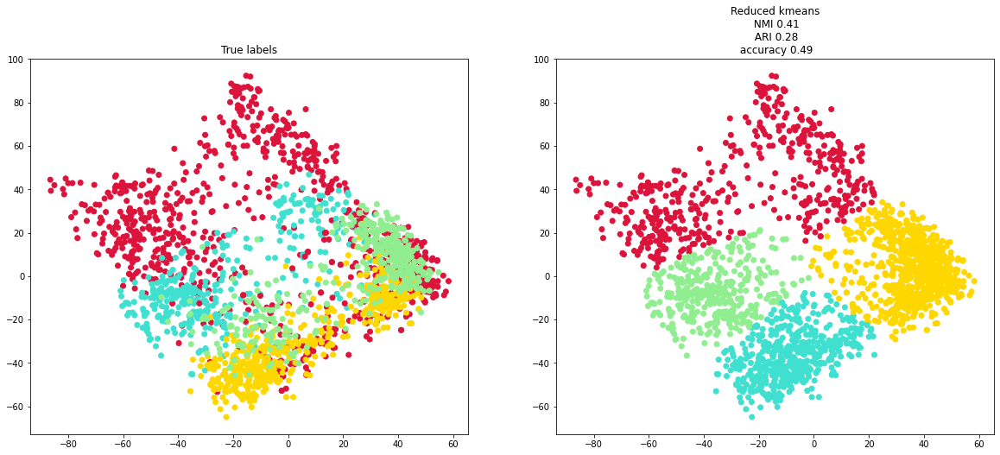

In [ ]:
eval_clustering_2(X_reduced_rkm, labels_int ,rkm, "True labels","Reduced kmeans")

> #### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(fkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(fkm_pred_labels, labels_int),2),
          "accuracy": accuracy(fkm_pred_labels, labels_int)}

  |======================================================================| 100%

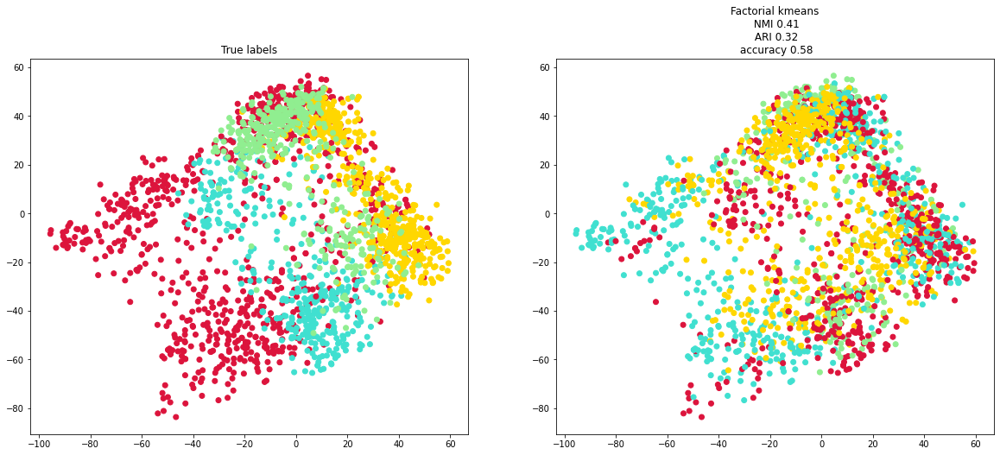

In [ ]:
eval_clustering_2(X_reduced_fkm, labels_int ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
import os
import math
import tensorflow.compat.v1 as tf

In [ ]:
"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})

        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]

    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels,
          "NMI": round(normalized_mutual_info_score(dcn_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(dcn_pred_labels, labels_int),2),
          "accuracy": accuracy(dcn_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [02:26<00:00,  2.93s/it]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [02:31<00:00,  3.04s/it]


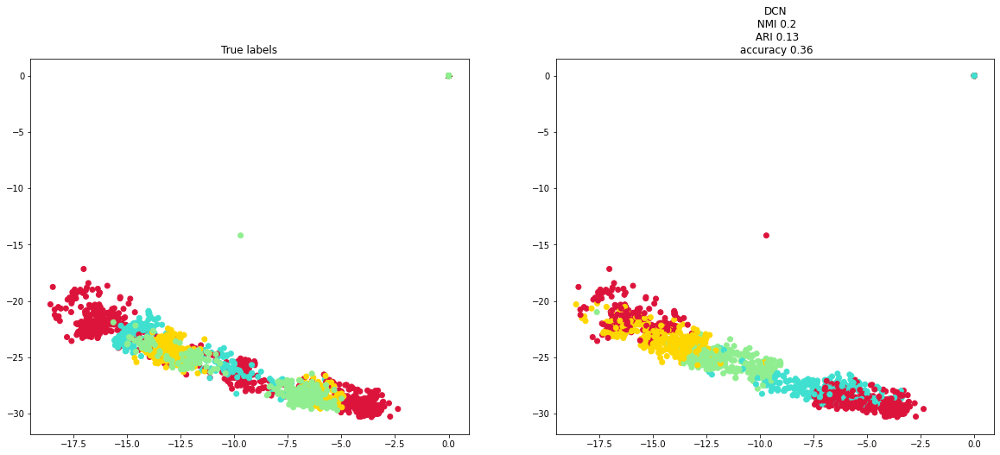

In [ ]:
eval_clustering_2(X_reduced_dcn, labels_int ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(dkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(dkm_pred_labels, labels_int),2),
          "accuracy": accuracy(dkm_pred_labels, labels_int)}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [02:25<00:00,  2.90s/it]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [04:49<00:00, 14.49s/it]


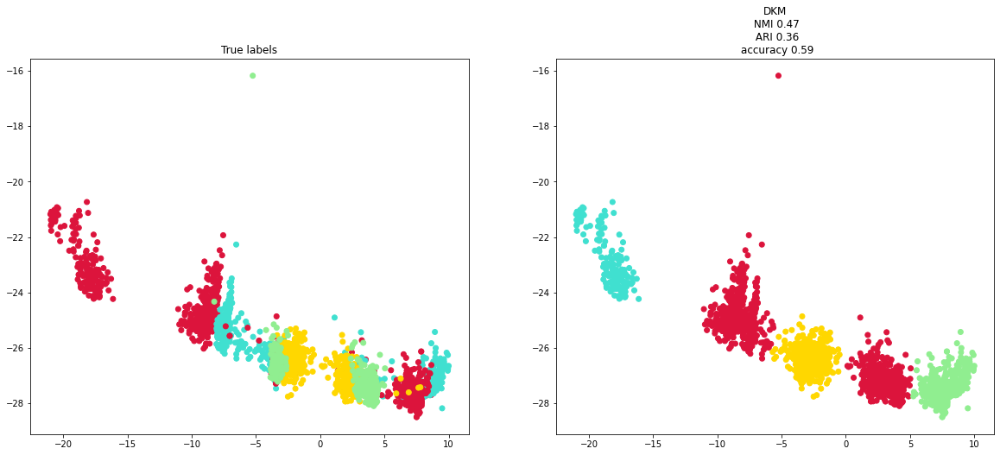

In [ ]:
eval_clustering_2(X_reduced_dkm, labels_int ,dkm, "True labels","DKM")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(rkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(rkm_pred_labels, labels_int),2),
          "accuracy": accuracy(rkm_pred_labels, labels_int)}

  |======================================================================| 100%

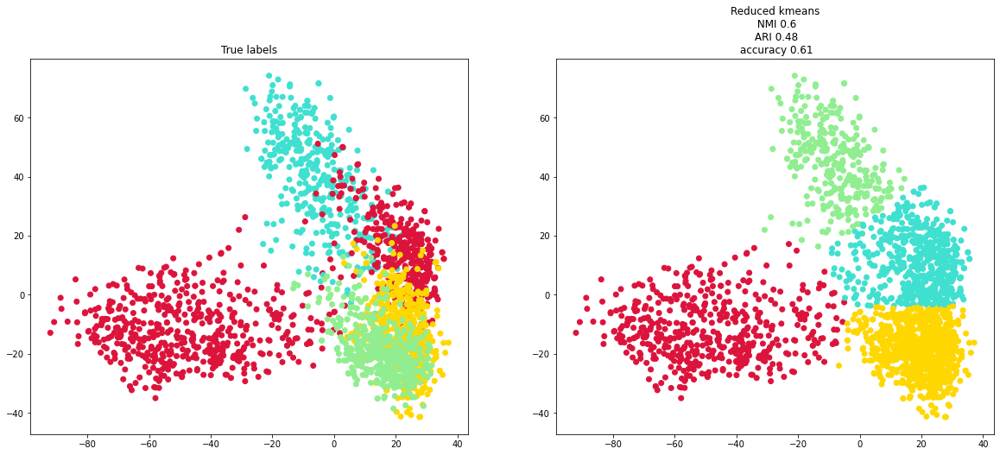

In [ ]:
eval_clustering_2(X_reduced_rkm, labels_int ,rkm, "True labels","Reduced kmeans")

>#### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(fkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(fkm_pred_labels, labels_int),2),
          "accuracy": accuracy(fkm_pred_labels, labels_int)}

  |======================================================================| 100%

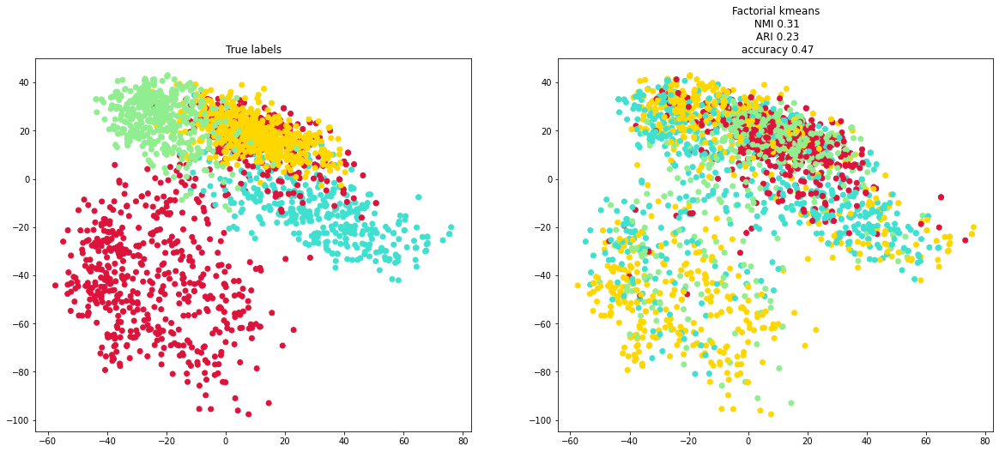

In [ ]:
eval_clustering_2(X_reduced_fkm, labels_int ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels,
          "NMI": round(normalized_mutual_info_score(dcn_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(dcn_pred_labels, labels_int),2),
          "accuracy": accuracy(dcn_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [02:25<00:00,  2.91s/it]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [02:28<00:00,  2.97s/it]


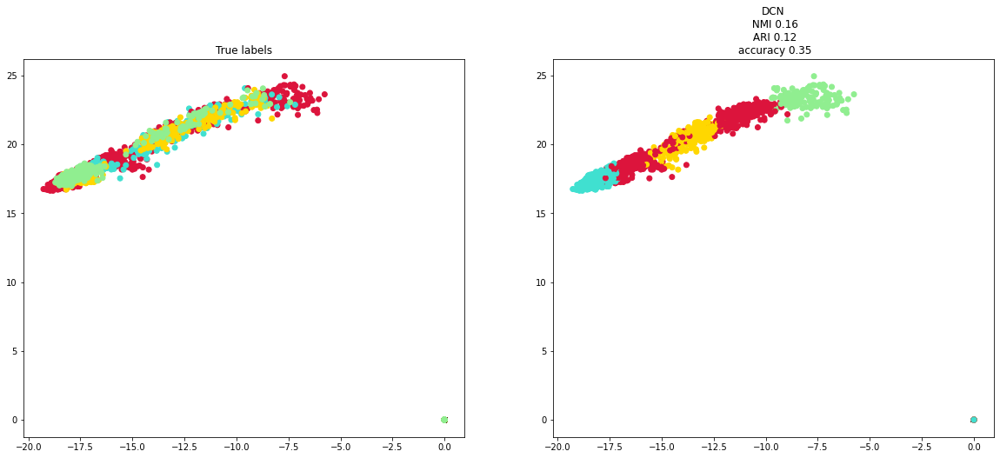

In [ ]:
eval_clustering_2(X_reduced_dcn, labels_int ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(dkm_pred_labels, labels_int),2),
          "ARI": round(adjusted_rand_score(dkm_pred_labels, labels_int),2),
          "accuracy": accuracy(dkm_pred_labels, labels_int)}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [02:22<00:00,  2.86s/it]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [04:45<00:00, 14.29s/it]


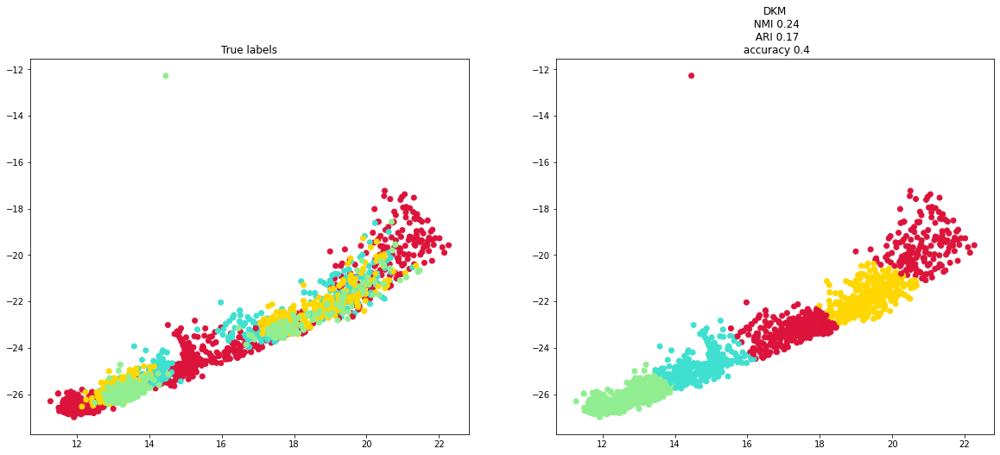

In [ ]:
eval_clustering_2(X_reduced_dkm, labels_int ,dkm, "True labels","DKM")

# Dataset Article 1

## Importation du dataset

In [ ]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt

In [ ]:
#Article 1
article1= pd.read_csv("nlp_dataset_Articles_1.csv", sep=";")
texts = article1['text'].values

## Representation textuelle

### BERT

In [ ]:
!pip install transformers

     |████████████████████████████████| 3.3 MB 7.0 MB/s 
     |████████████████████████████████| 596 kB 67.2 MB/s 
     |████████████████████████████████| 3.3 MB 32.6 MB/s 
     |████████████████████████████████| 895 kB 78.1 MB/s 
     |████████████████████████████████| 61 kB 607 kB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
def collate_fn(batch_sentences, tokenizer):#recopier à partir de utils
    tokenized = tokenizer(batch_sentences, padding=True, truncation=True, max_length=512)
    inds = tokenized['input_ids']
    mask = tokenized['attention_mask']

    inds = torch.tensor(inds)
    mask = torch.tensor(mask)

    return inds, mask

def encode_sentences_batch(model, tokenizer, sentences, batch_size=32):
    n_layers = model.config.num_hidden_layers
    tokenized_sentences = [tokenizer.tokenize(sent)[:512] for sent in sentences]

    # sort by length
    argsort = np.argsort([len(i) for i in tokenized_sentences])
    sorted_inds = np.argsort(argsort)

    sentences = [sentences[i] for i in argsort]

    # sentences_dataset = BertDataset(sentences)
    data_loader = DataLoader(dataset=sentences,
                                batch_size=batch_size,
                                shuffle=False,
                                num_workers=4,
                                collate_fn=lambda x: collate_fn(x, tokenizer)
                                )

    embeddings = {k:[] for k in range(n_layers)}
    for _, batch in enumerate(data_loader):
        with torch.no_grad():
            x, mask = batch
            x = x.to(device)

            output = model(x)
            hidden_states = output.hidden_states
            hidden_states = list(hidden_states[1:])

            for ind_layer, layer_embeddings in enumerate(hidden_states):
                # remove padding's zeros
                layer_embeddings = layer_embeddings.cpu() * mask[:, :, None]
                # compute average over tokens
                layer_hidden_state = layer_embeddings.mean(axis=1)

                embeddings[ind_layer].append(layer_hidden_state)

    # put the batches together and sort the documents
    embeddings = [torch.vstack(embeddings[layer_ind])[sorted_inds].numpy() for layer_ind in range(n_layers)]

    return embeddings

In [ ]:
import transformers
from transformers import BertModel, BertTokenizer, RobertaModel, RobertaTokenizer
from torch.utils.data import DataLoader
import torch

In [ ]:
if torch.cuda.is_available():
  device='cuda'
else:
  device='cpu'

In [ ]:
model_name='bert-base-cased'
model=BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer=BertTokenizer.from_pretrained(model_name)

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/416M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/208k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/426k [00:00<?, ?B/s]

In [ ]:
if device=='cuda':
  model.cuda()

In [ ]:
bert_embeddings=encode_sentences_batch(model, tokenizer, texts, batch_size=32)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
#Concaténation
bert_embeddings_concat=np.concatenate(bert_embeddings, axis=1)
bert_embeddings_concat.shape

(3985, 9216)

In [ ]:
#Moyenne
bert_embeddings_avg=np.mean(bert_embeddings, axis=0)
bert_embeddings_avg.shape

(3985, 768)

### RoBERTa

In [ ]:
model_name='roberta-base'
model=RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer=RobertaTokenizer.from_pretrained(model_name)

Downloading:   0%|          | 0.00/481 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/478M [00:00<?, ?B/s]

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

In [ ]:
if device=='cuda':
  model.cuda()

In [ ]:
roberta_embeddings=encode_sentences_batch(model, tokenizer, texts, batch_size=32)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
#Concaténation
roberta_embeddings_concat=np.concatenate(roberta_embeddings, axis=1)
roberta_embeddings_concat.shape

(3985, 9216)

In [ ]:
#Moyenne
roberta_embeddings_avg=np.mean(roberta_embeddings, axis=0)
roberta_embeddings_avg.shape

(3985, 768)

## Trouver le nombre de classe avec la méthode Elbow


In [ ]:
from sklearn.cluster import KMeans

distortions = []
K = range(1,10)
for i in K:
    kmeanModel = KMeans(n_clusters=i)
    kmeanModel.fit(bert_embeddings_concat)
    distortions.append(kmeanModel.inertia_)

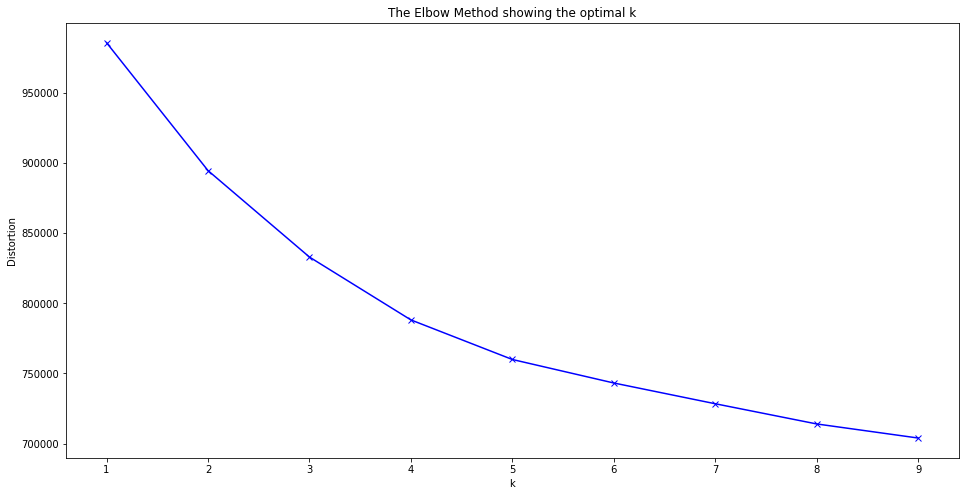

In [ ]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [ ]:
k=4

## Clustering sur les données d'origine

In [ ]:
!pip install hdbscan

     |████████████████████████████████| 6.4 MB 5.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311917 sha256=3e1213068928ccefc66a894244af0deda3f3a7b83d95f7e45e3407235d0881ca
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan


In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
import  hdbscan
from sklearn.cluster import AgglomerativeClustering

import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

In [ ]:
#Define an accuracy function

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)


def accuracy(true_row_labels, predicted_row_labels):
    """Get the best accuracy.

    Parameters
    ----------
    true_row_labels: array-like
        The true row labels, given as external information
    predicted_row_labels: array-like
        The row labels predicted by the model

    Returns
    -------
    float
        Best value of accuracy
    """

    cm = confusion_matrix(true_row_labels, predicted_row_labels)
    indexes = linear_sum_assignment(_make_cost_m(cm))
    total = 0
    for row, column in zip(*indexes):
        value = cm[row][column]
        total += value

    return round(total * 1. / np.sum(cm),2)

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
def eval_clustering_7(X_reduced, model1, model2, model3, model4, model5, model6, model7, title0, title1, title2, title3, title4,
                      title5, title6,title7):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,4,figsize=(20,8))


    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1  )

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model2["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title2)

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model3["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title3)

    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model4["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title4)

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model5["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title5)

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model6["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title6)

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model7["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title7)

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels
        }

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels
                      }


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels
         }


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels
          }

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels
          }

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels}

In [ ]:
#PCA for visualisation
X_reduced=PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)

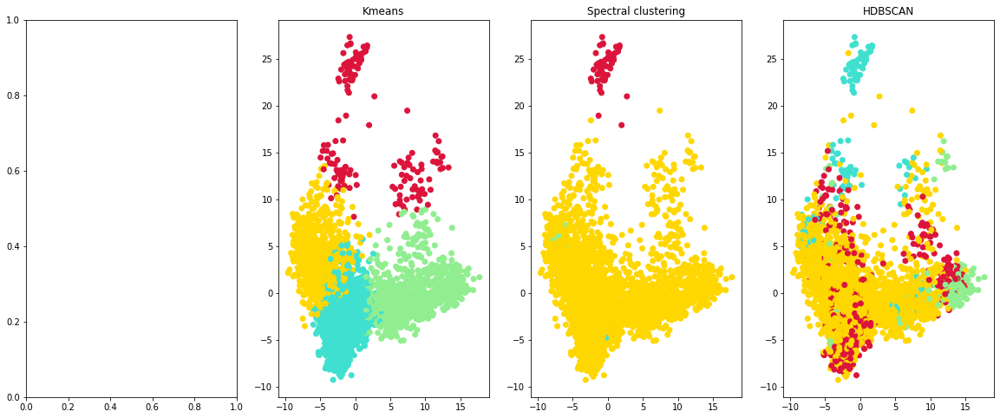

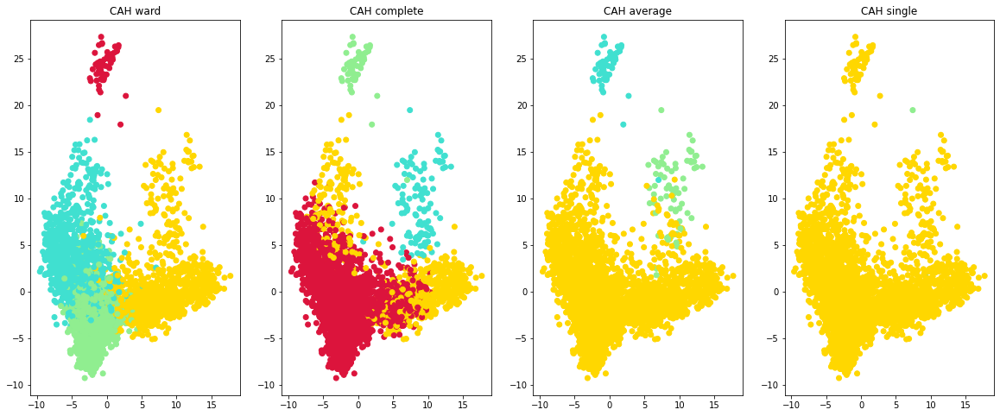

In [ ]:
eval_clustering_7(X_reduced,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels}


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels}


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels}

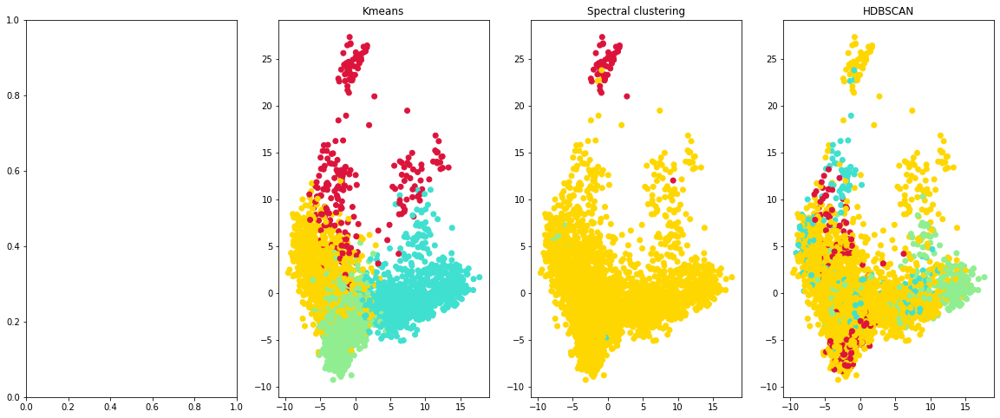

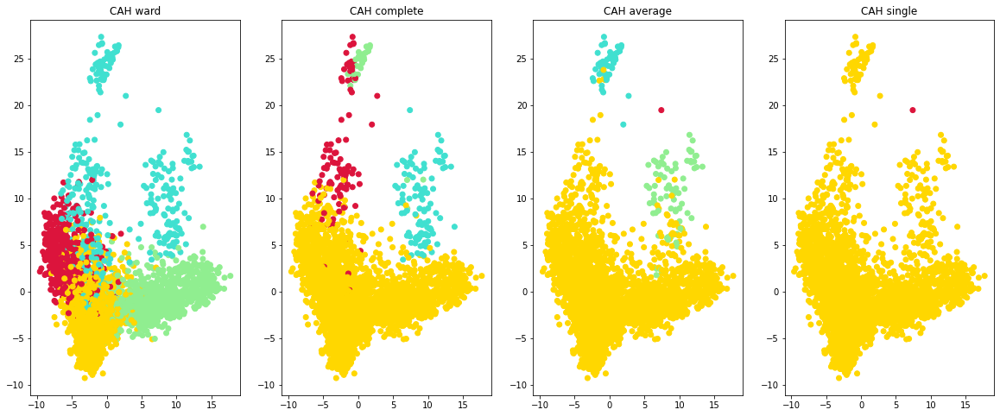

In [ ]:
eval_clustering_7(X_reduced ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Clustering sur les données reduites : Tandem

In [ ]:
!pip install umap.learn

     |████████████████████████████████| 86 kB 4.6 MB/s 
     |████████████████████████████████| 1.1 MB 32.8 MB/s 
  Created wheel for umap.learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=e70614b21852859d1ef6176da5902b7ca86db1e86a2e54b7cf15d2fa51925404
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=98c57486d3d4832b63acfbbf0aea3478c12feda0a7eab0fc7d275eb41481e7f8
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap.learn pynndescent


In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from torch.utils.data import DataLoader
import torch
from tqdm import tqdm

In [ ]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim
        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.embedding_dim)
        )

        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.input_dim),
            torch.nn.Sigmoid()
        )
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'
    if seed is not None:
      torch.manual_seed(seed)
    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)
    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)

          loss = loss_function(reconstructed, batch)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
100%|██████████| 50/50 [01:55<00:00,  2.31s/it]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels}

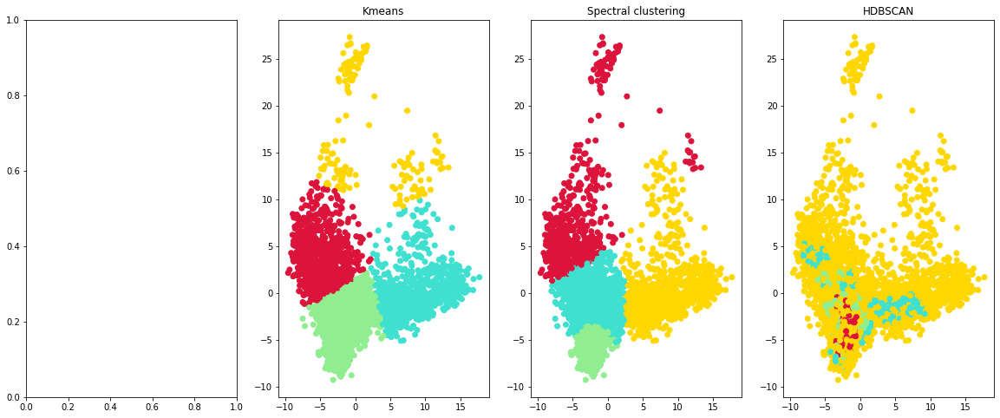

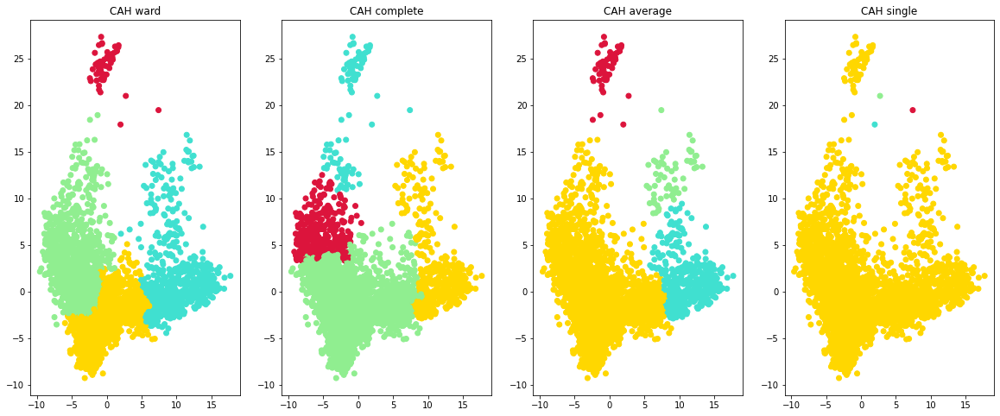

In [ ]:
eval_clustering_7(X_reduced_PCA ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels}

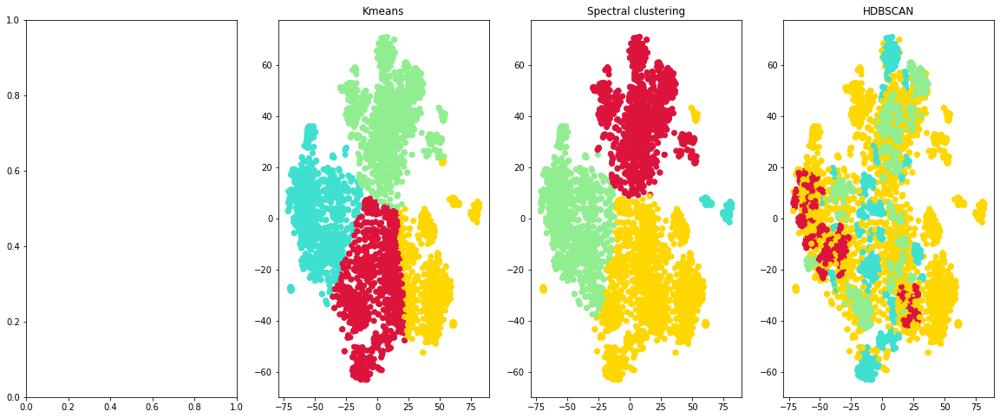

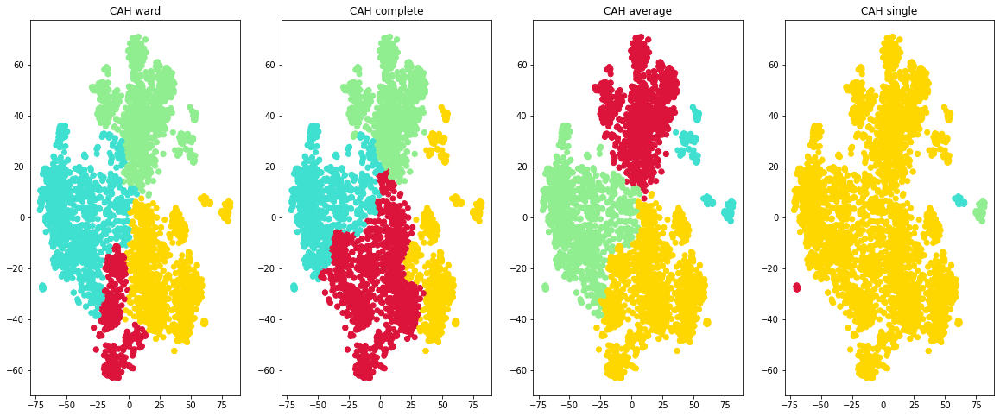

In [ ]:
eval_clustering_7(X_reduced_TSNE ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels}

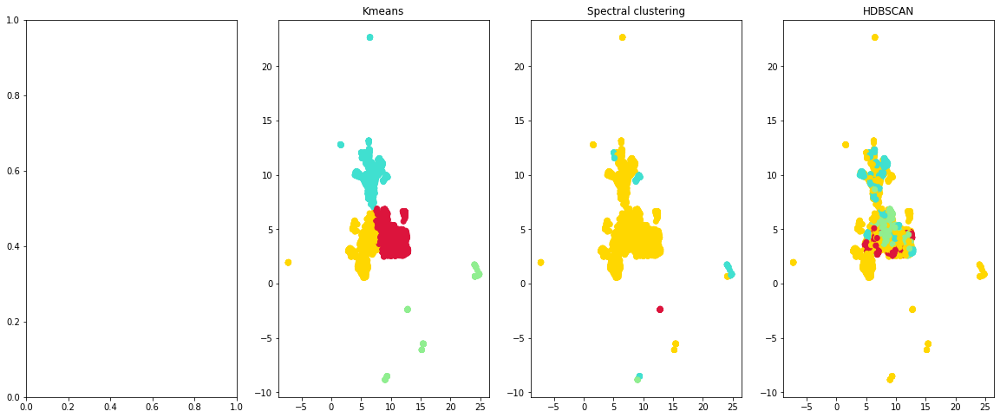

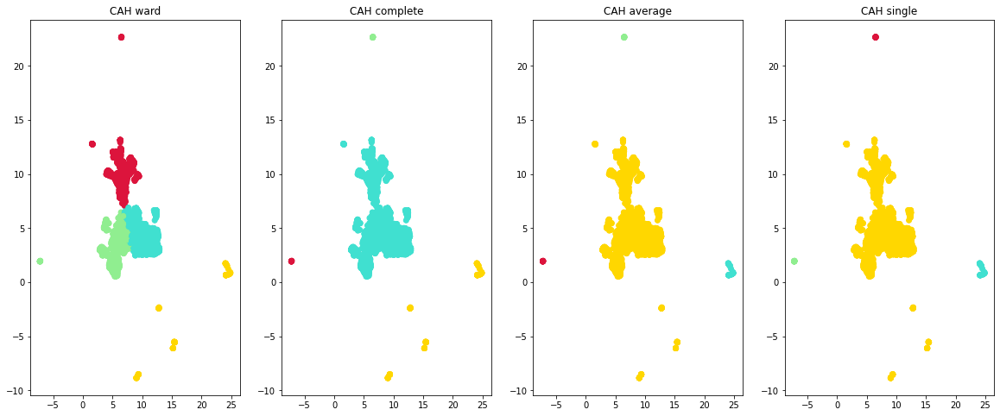

In [ ]:
eval_clustering_7(X_reduced_UMAP ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels}

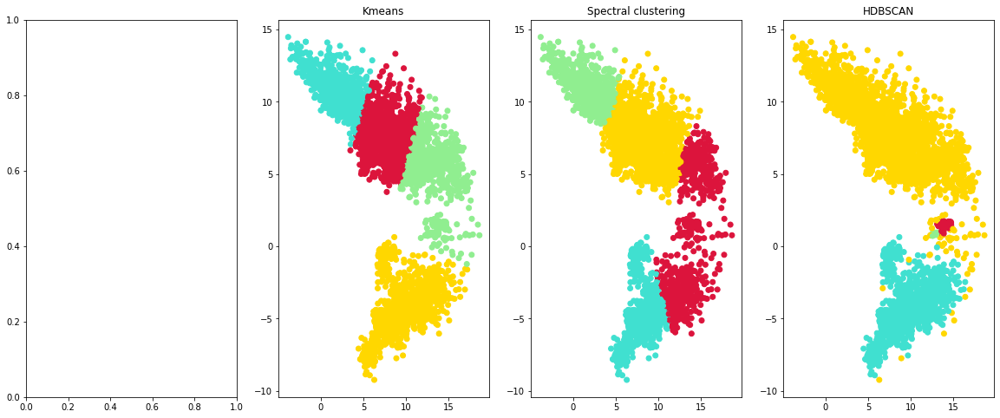

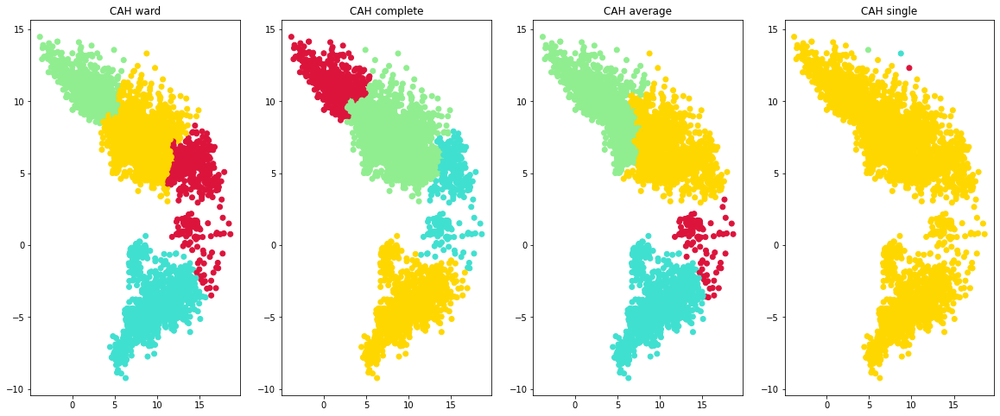

In [ ]:
eval_clustering_7(X_reduced_autoencoder ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [01:53<00:00,  2.28s/it]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels}

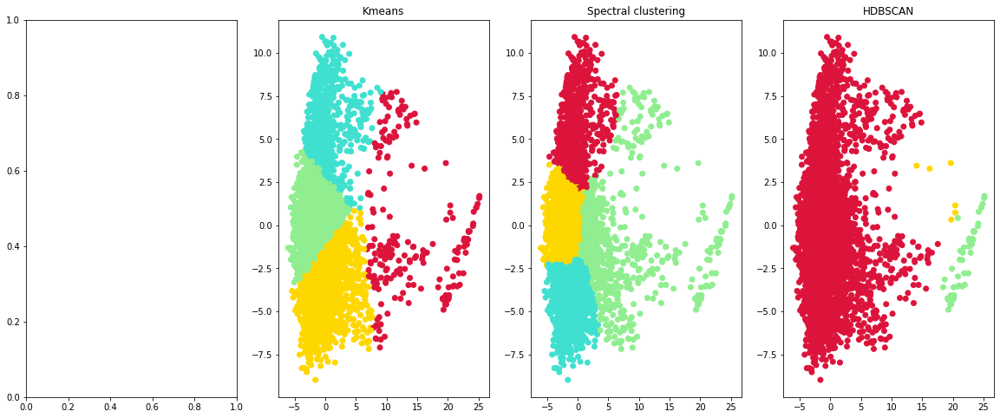

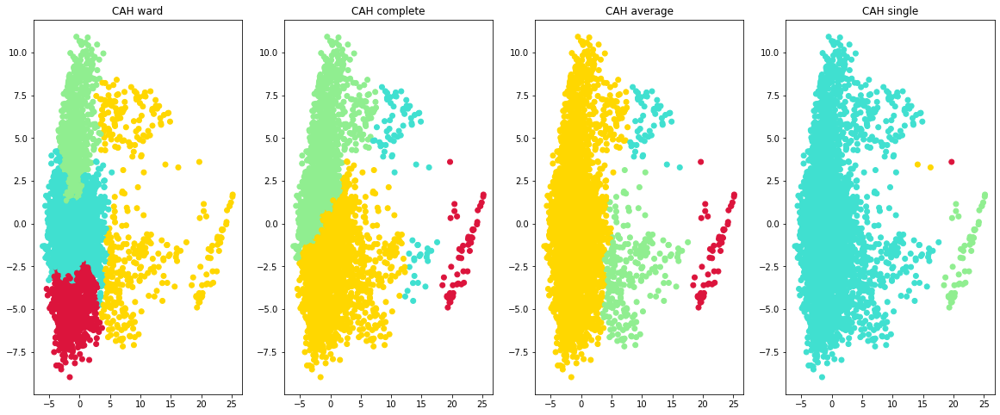

In [ ]:
eval_clustering_7(X_reduced_PCA ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels}

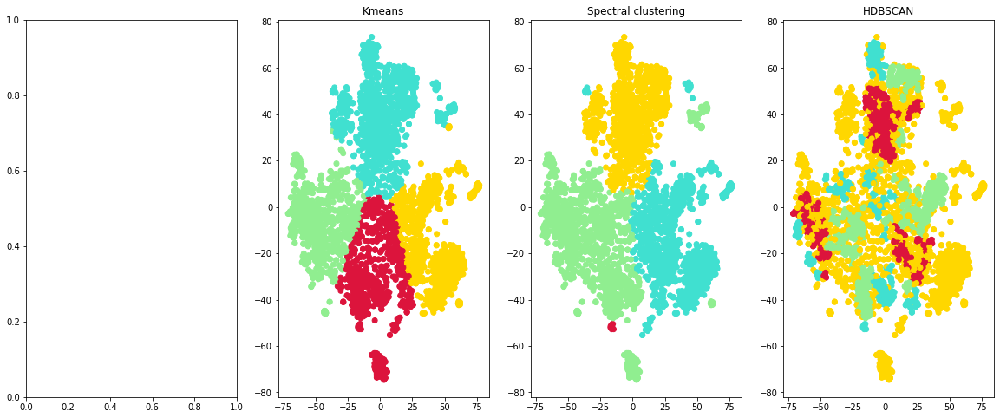

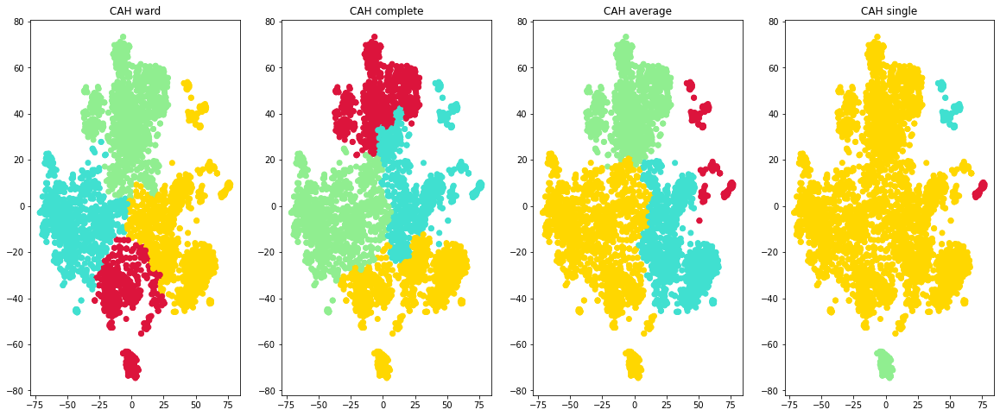

In [ ]:
eval_clustering_7(X_reduced_TSNE ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels}

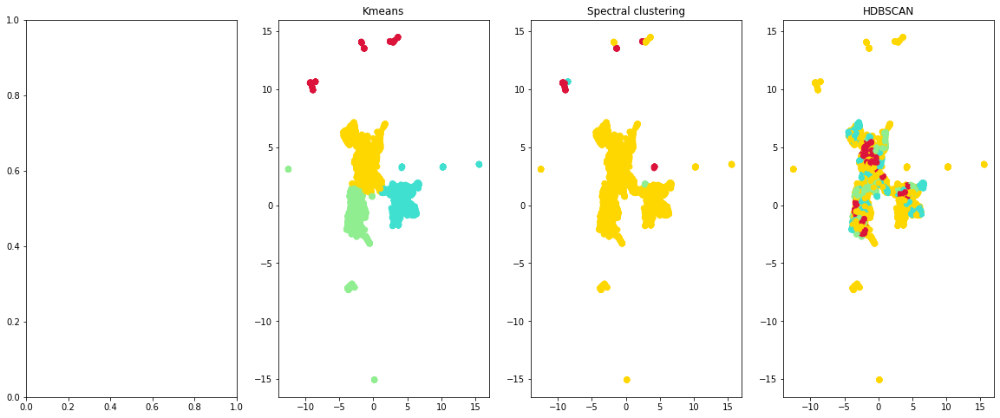

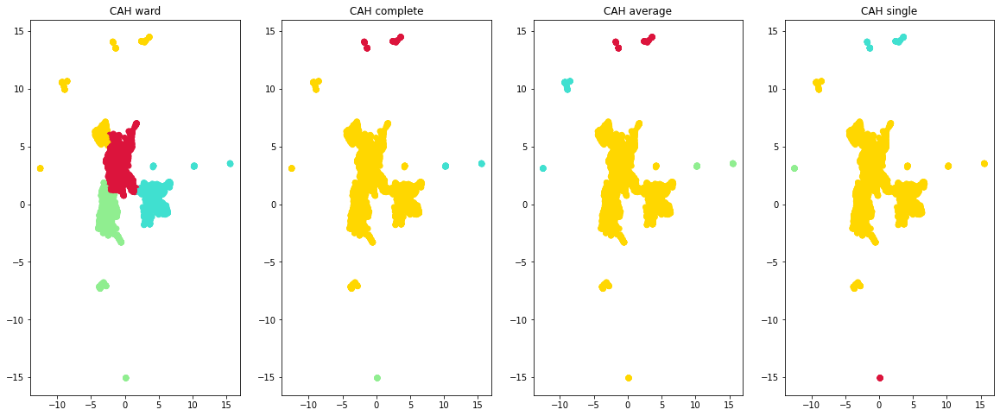

In [ ]:
eval_clustering_7(X_reduced_UMAP ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels}

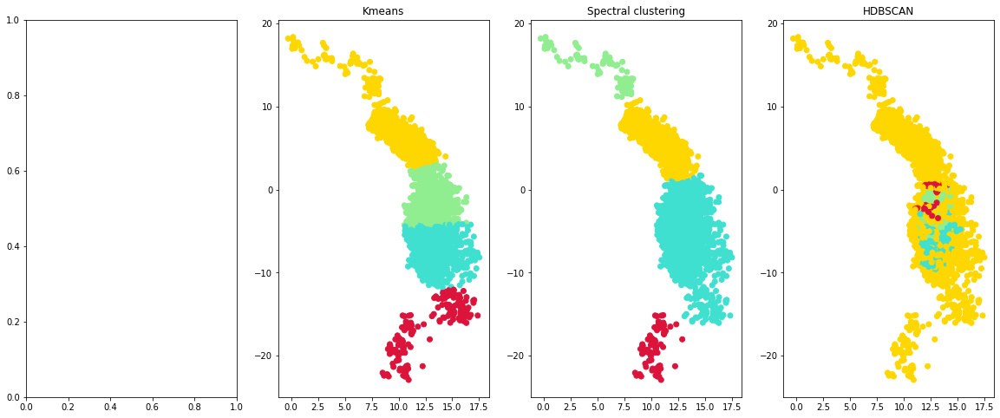

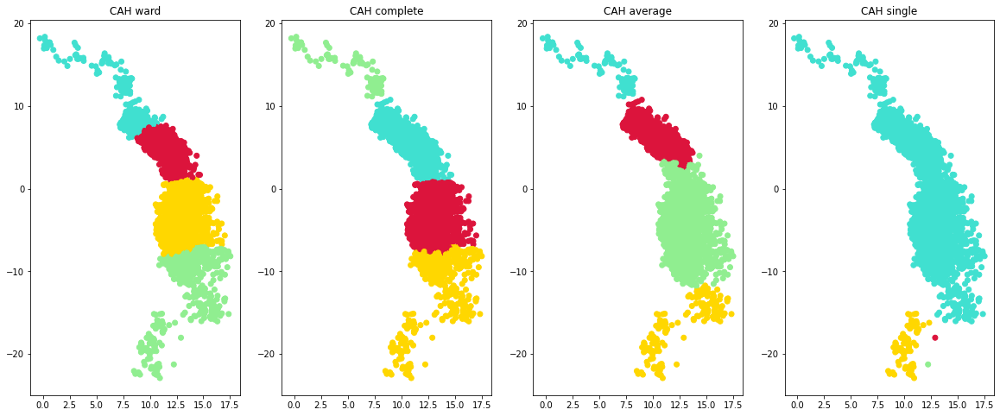

In [ ]:
eval_clustering_7(X_reduced_autoencoder ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Méthodes combinées

### BERT

In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
import  hdbscan
from sklearn.cluster import AgglomerativeClustering

import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

In [ ]:
#Define an accuracy function

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)


def accuracy(true_row_labels, predicted_row_labels):
    """Get the best accuracy.

    Parameters
    ----------
    true_row_labels: array-like
        The true row labels, given as external information
    predicted_row_labels: array-like
        The row labels predicted by the model

    Returns
    -------
    float
        Best value of accuracy
    """

    cm = confusion_matrix(true_row_labels, predicted_row_labels)
    indexes = linear_sum_assignment(_make_cost_m(cm))
    total = 0
    for row, column in zip(*indexes):
        value = cm[row][column]
        total += value

    return round(total * 1. / np.sum(cm),2)

In [ ]:
def eval_clustering_7(X_reduced, model1, model2, model3, model4, model5, model6, model7, title0, title1, title2, title3, title4,
                      title5, title6,title7):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1)

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model2["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title2)

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model3["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title3)

    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model4["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title4)

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model5["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title5)

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model6["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title6)

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model7["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title7)

In [ ]:
X=bert_embeddings_concat

In [ ]:
!pip install rpy2

In [ ]:
import rpy2.robjects.numpy2ri
rpy2.robjects.numpy2ri.activate()

In [ ]:
from rpy2.robjects.packages import importr
utils= importr('utils')

In [ ]:
utils.install_packages('FCPS', repos="https://cloud.r-project.org")

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘plyr’, ‘sp’, ‘pracma’, ‘reshape2’, ‘RcppArmadillo’, ‘mclust’, ‘DataVisualizations’


R[write to console]: trying URL 'https://cloud.r-project.org/src/contrib/plyr_1.8.6.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 401191 bytes (391 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[wr

<rpy2.rinterface_lib.sexp.NULLType object at 0x7f50635b9460> [RTYPES.NILSXP]

In [ ]:
fcps=importr('FCPS')

In [ ]:
utils.install_packages('clustrd')

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘RcppEigen’, ‘modeltools’, ‘DEoptimR’, ‘RSpectra’, ‘reshape’, ‘flexmix’, ‘prabclus’, ‘diptest’, ‘robustbase’, ‘kernlab’, ‘rARPACK’, ‘corpcor’, ‘GGally’, ‘fpc’, ‘ggrepel’, ‘ca’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/RcppEigen_0.3.3.9.1.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 1633360 bytes (1.6 MB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]:

<rpy2.rinterface_lib.sexp.NULLType object at 0x7f50635b9460> [RTYPES.NILSXP]

In [ ]:
def eval_clustering_2(X_reduced, model1,  title0, title1):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1)

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels}

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



  |======================================================================| 100%

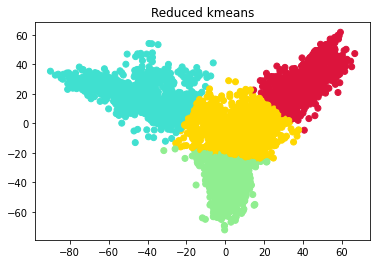

In [ ]:
eval_clustering_2(X_reduced_rkm ,rkm, "True labels","Reduced kmeans")

> #### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels}

  |======================================================================| 100%

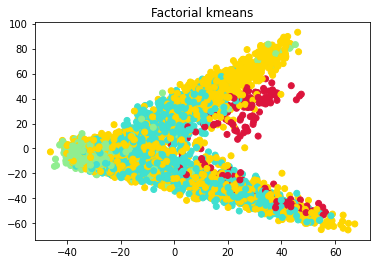

In [ ]:
eval_clustering_2(X_reduced_fkm ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
import os
import math
import tensorflow.compat.v1 as tf
from tqdm import tqdm

In [ ]:
"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})

        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]

    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [04:04<00:00,  4.88s/it]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [04:20<00:00,  5.21s/it]


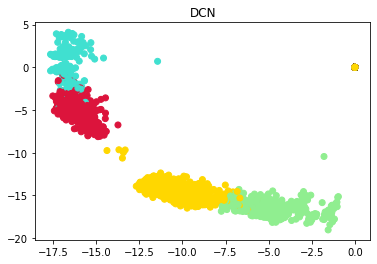

In [ ]:
eval_clustering_2(X_reduced_dcn ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [04:08<00:00,  4.97s/it]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [08:18<00:00, 24.94s/it]


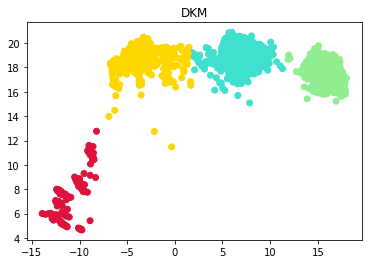

In [ ]:
eval_clustering_2(X_reduced_dkm ,dkm, "True labels","DKM")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels}

  |======================================================================| 100%

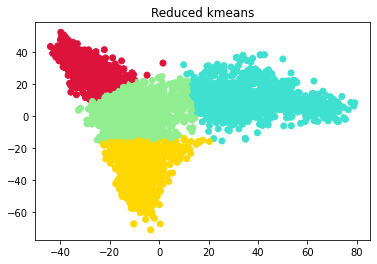

In [ ]:
eval_clustering_2(X_reduced_rkm ,rkm, "True labels","Reduced kmeans")

>#### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels}

  |======================================================================| 100%

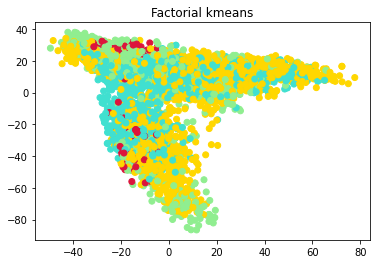

In [ ]:
eval_clustering_2(X_reduced_fkm ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [04:08<00:00,  4.96s/it]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [04:00<00:00,  4.82s/it]


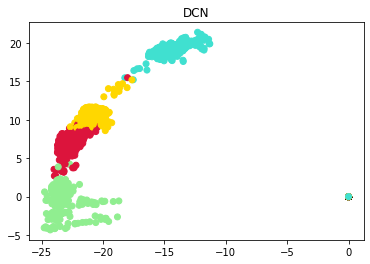

In [ ]:
eval_clustering_2(X_reduced_dcn ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels = dkm_model[1]
X_reduced_dkm = dkm_model[0]

dkm = {"labels": dkm_pred_labels}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [04:06<00:00,  4.93s/it]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [08:06<00:00, 24.34s/it]


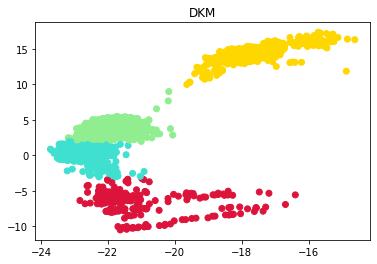

In [ ]:
eval_clustering_2(X_reduced_dkm ,dkm, "True labels","DKM")

# Dataset Article 2

## Importation du dataset

In [ ]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt

In [ ]:
#Article 1
article2= pd.read_csv("nlp_dataset_Articles_2.csv")
texts = article2['\ttext'].values
texts = [x[3:] for x in texts]

## Representation textuelle

### BERT

In [ ]:
!pip install transformers

     |████████████████████████████████| 3.3 MB 37.9 MB/s 
     |████████████████████████████████| 895 kB 39.6 MB/s 
     |████████████████████████████████| 3.3 MB 36.1 MB/s 
     |████████████████████████████████| 596 kB 44.1 MB/s 
     |████████████████████████████████| 61 kB 534 kB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
def collate_fn(batch_sentences, tokenizer):#recopier à partir de utils
    tokenized = tokenizer(batch_sentences, padding=True, truncation=True, max_length=512)
    inds = tokenized['input_ids']
    mask = tokenized['attention_mask']

    inds = torch.tensor(inds)
    mask = torch.tensor(mask)

    return inds, mask

def encode_sentences_batch(model, tokenizer, sentences, batch_size=32):
    n_layers = model.config.num_hidden_layers
    tokenized_sentences = [tokenizer.tokenize(sent)[:512] for sent in sentences]

    # sort by length
    argsort = np.argsort([len(i) for i in tokenized_sentences])
    sorted_inds = np.argsort(argsort)

    sentences = [sentences[i] for i in argsort]

    # sentences_dataset = BertDataset(sentences)
    data_loader = DataLoader(dataset=sentences,
                                batch_size=batch_size,
                                shuffle=False,
                                num_workers=4,
                                collate_fn=lambda x: collate_fn(x, tokenizer)
                                )

    embeddings = {k:[] for k in range(n_layers)}
    for _, batch in enumerate(data_loader):
        with torch.no_grad():
            x, mask = batch
            x = x.to(device)

            output = model(x)
            hidden_states = output.hidden_states
            hidden_states = list(hidden_states[1:])

            for ind_layer, layer_embeddings in enumerate(hidden_states):
                # remove padding's zeros
                layer_embeddings = layer_embeddings.cpu() * mask[:, :, None]
                # compute average over tokens
                layer_hidden_state = layer_embeddings.mean(axis=1)

                embeddings[ind_layer].append(layer_hidden_state)

    # put the batches together and sort the documents
    embeddings = [torch.vstack(embeddings[layer_ind])[sorted_inds].numpy() for layer_ind in range(n_layers)]

    return embeddings

In [ ]:
import transformers
from transformers import BertModel, BertTokenizer, RobertaModel, RobertaTokenizer
from torch.utils.data import DataLoader
import torch

In [ ]:
if torch.cuda.is_available():
  device='cuda'
else:
  device='cpu'

In [ ]:
model_name='bert-base-cased'
model=BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer=BertTokenizer.from_pretrained(model_name)

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/416M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/208k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/426k [00:00<?, ?B/s]

In [ ]:
if device=='cuda':
  model.cuda()

In [ ]:
bert_embeddings=encode_sentences_batch(model, tokenizer, texts, batch_size=32)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
#Concaténation
bert_embeddings_concat=np.concatenate(bert_embeddings, axis=1)
bert_embeddings_concat.shape

(5089, 9216)

In [ ]:
#Moyenne
bert_embeddings_avg=np.mean(bert_embeddings, axis=0)
bert_embeddings_avg.shape

(5089, 768)

### RoBERTa

In [ ]:
model_name='roberta-base'
model=RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer=RobertaTokenizer.from_pretrained(model_name)

Downloading:   0%|          | 0.00/481 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/478M [00:00<?, ?B/s]

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.decoder.weight', 'lm_head.dense.weight', 'lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

In [ ]:
if device=='cuda':
  model.cuda()

In [ ]:
roberta_embeddings=encode_sentences_batch(model, tokenizer, texts, batch_size=32)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
#Concaténation
roberta_embeddings_concat=np.concatenate(roberta_embeddings, axis=1)
roberta_embeddings_concat.shape

(5089, 9216)

In [ ]:
#Moyenne
roberta_embeddings_avg=np.mean(roberta_embeddings, axis=0)
roberta_embeddings_avg.shape

(5089, 768)

## Trouver le nombre de classe avec la méthode Elbow


In [ ]:
from sklearn.cluster import KMeans

distortions = []
K = range(1,10)
for i in K:
    kmeanModel = KMeans(n_clusters=i)
    kmeanModel.fit(bert_embeddings_concat)
    distortions.append(kmeanModel.inertia_)

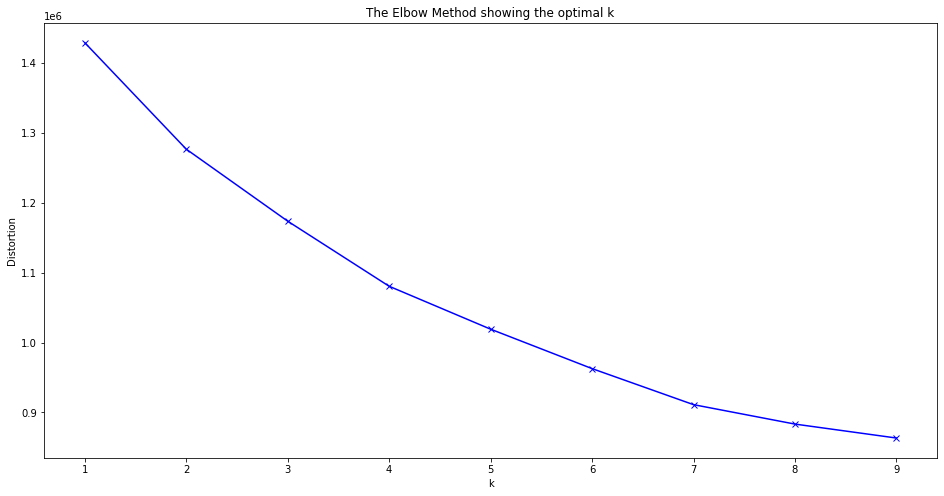

In [ ]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [ ]:
k=4

## Clustering sur les données d'origine

In [ ]:
!pip install hdbscan

     |████████████████████████████████| 6.4 MB 29.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311866 sha256=af72230ef5daf0f40e22521fa1dd3c50b9b0ebfb17dc792acf30281c84777a73
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan


In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
import  hdbscan
from sklearn.cluster import AgglomerativeClustering

import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

In [ ]:
#Define an accuracy function

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)


def accuracy(true_row_labels, predicted_row_labels):
    """Get the best accuracy.

    Parameters
    ----------
    true_row_labels: array-like
        The true row labels, given as external information
    predicted_row_labels: array-like
        The row labels predicted by the model

    Returns
    -------
    float
        Best value of accuracy
    """

    cm = confusion_matrix(true_row_labels, predicted_row_labels)
    indexes = linear_sum_assignment(_make_cost_m(cm))
    total = 0
    for row, column in zip(*indexes):
        value = cm[row][column]
        total += value

    return round(total * 1. / np.sum(cm),2)

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
def eval_clustering_7(X_reduced, model1, model2, model3, model4, model5, model6, model7, title0, title1, title2, title3, title4,
                      title5, title6,title7):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,4,figsize=(20,8))


    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1  )

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model2["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title2)

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model3["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title3)

    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model4["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title4)

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model5["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title5)

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model6["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title6)

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model7["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title7)

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels
        }

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels
                      }


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels
         }


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels
          }

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels
          }

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels}

In [ ]:
#PCA for visualisation
X_reduced=PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)

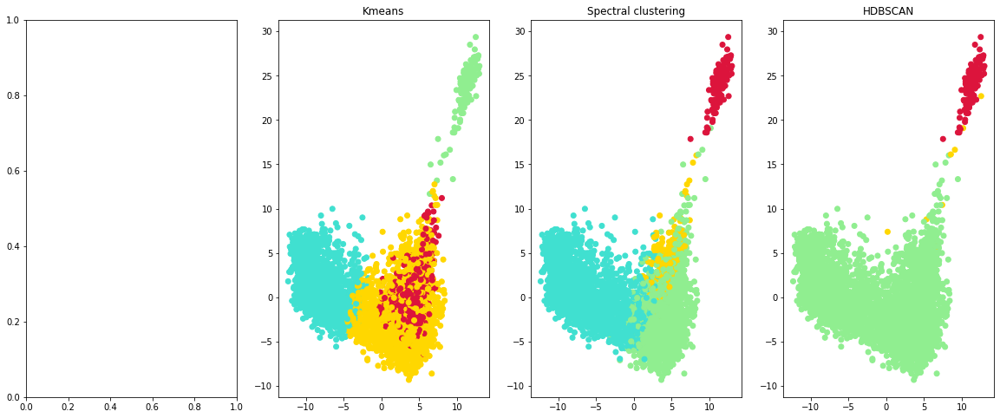

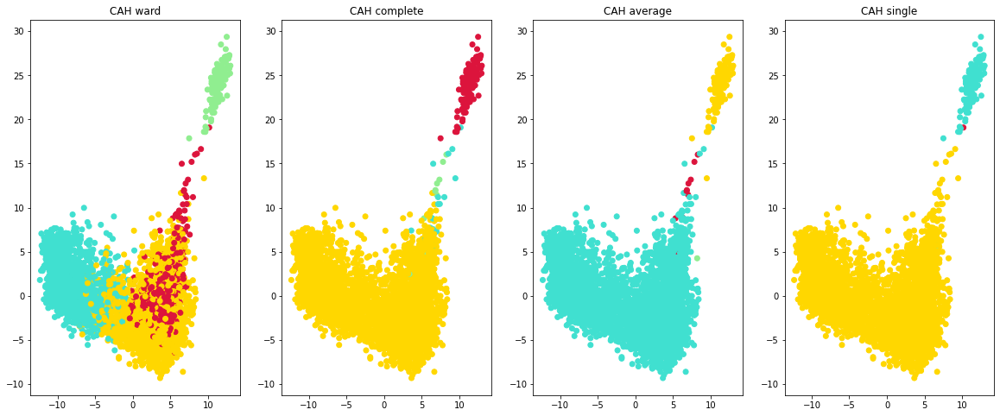

In [ ]:
eval_clustering_7(X_reduced,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels}


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels}


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels}

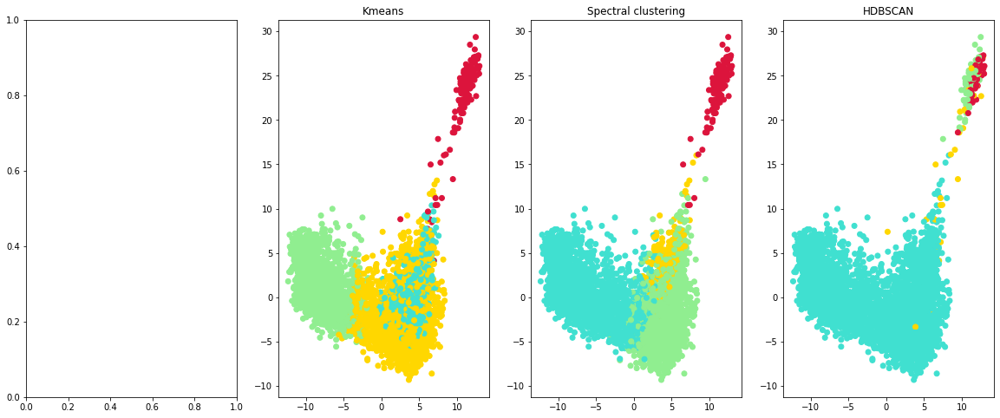

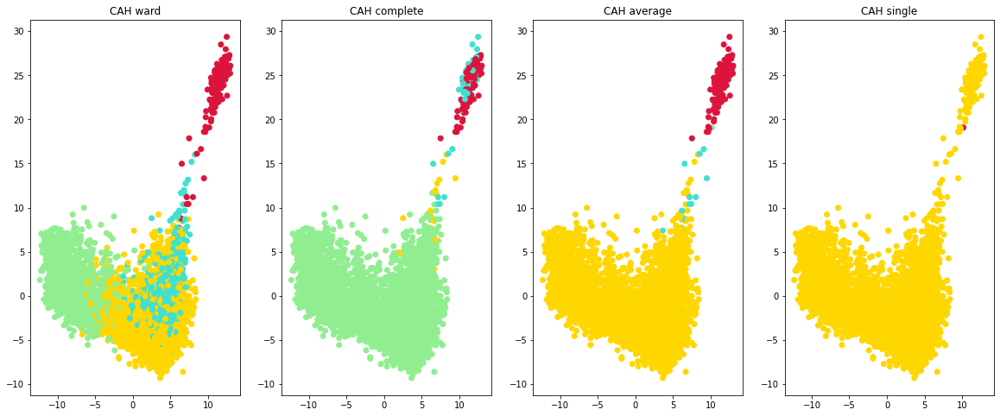

In [ ]:
eval_clustering_7(X_reduced ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Clustering sur les données reduites : Tandem

In [ ]:
!pip install umap.learn

     |████████████████████████████████| 86 kB 4.8 MB/s 
     |████████████████████████████████| 1.1 MB 22.3 MB/s 
  Created wheel for umap.learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=08c73700fc2f20918b9a9859752ab5ee06a60bfe6e0ff2793af3fa57f5dad051
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=c9b65ce5d6d1c228a91ab2f4432aaa1beb86a76317901fcbdbc6a6b48a82aa0c
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap.learn pynndescent


In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from torch.utils.data import DataLoader
import torch
from tqdm import tqdm

In [ ]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim
        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.embedding_dim)
        )

        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.input_dim),
            torch.nn.Sigmoid()
        )
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'
    if seed is not None:
      torch.manual_seed(seed)
    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)
    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)

          loss = loss_function(reconstructed, batch)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

### BERT

In [ ]:
X=bert_embeddings_concat

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
100%|██████████| 50/50 [02:48<00:00,  3.37s/it]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels}

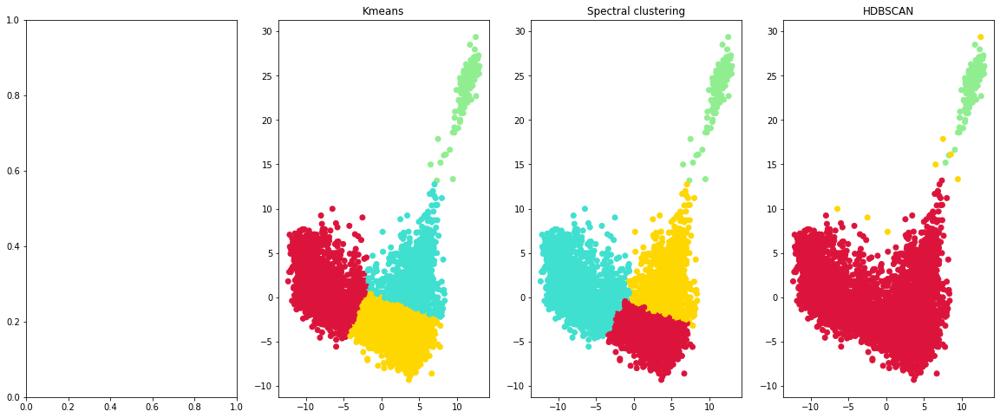

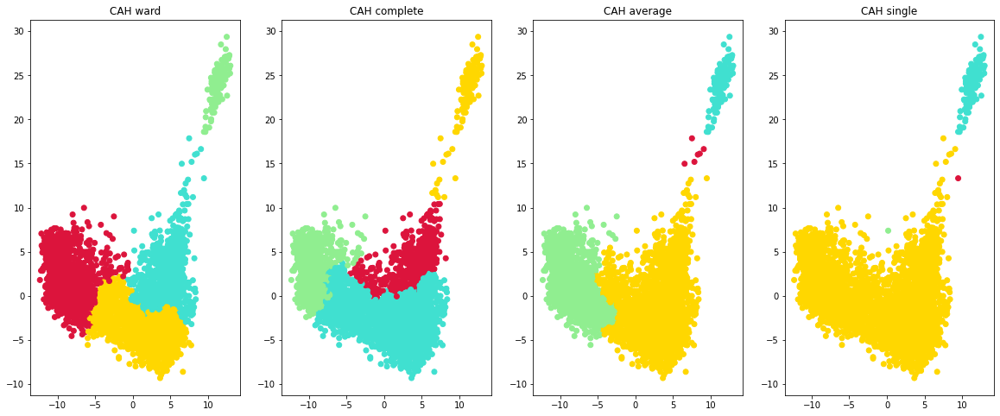

In [ ]:
eval_clustering_7(X_reduced_PCA ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels}

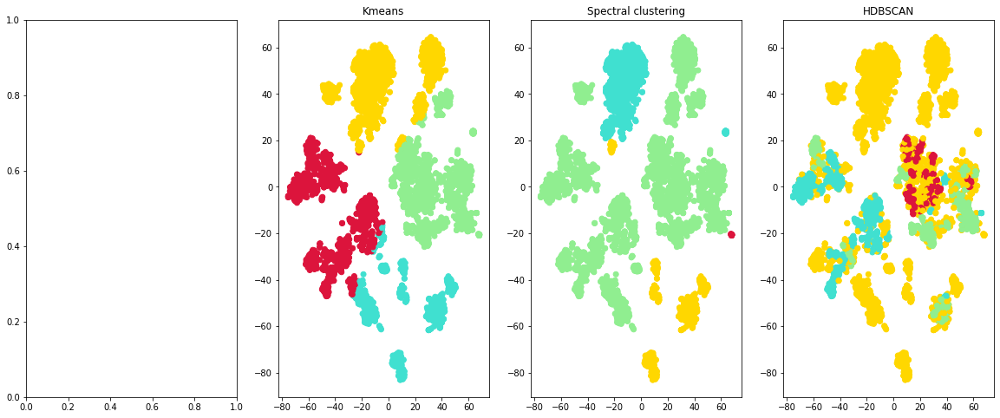

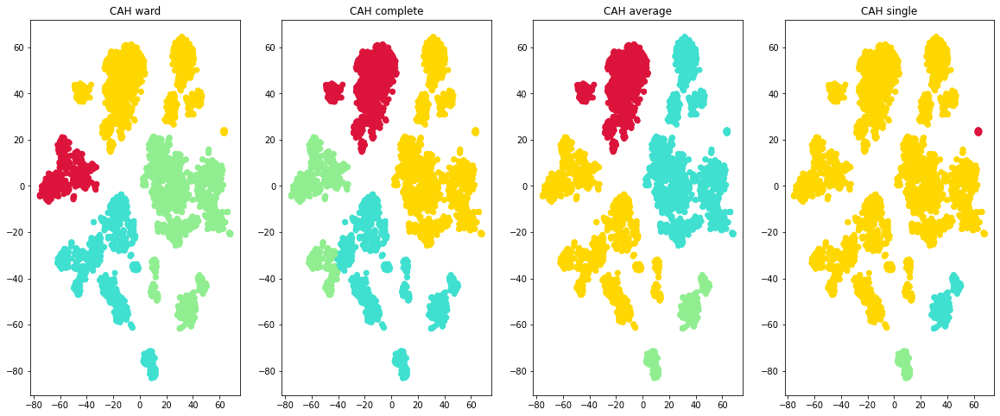

In [ ]:
eval_clustering_7(X_reduced_TSNE ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels}

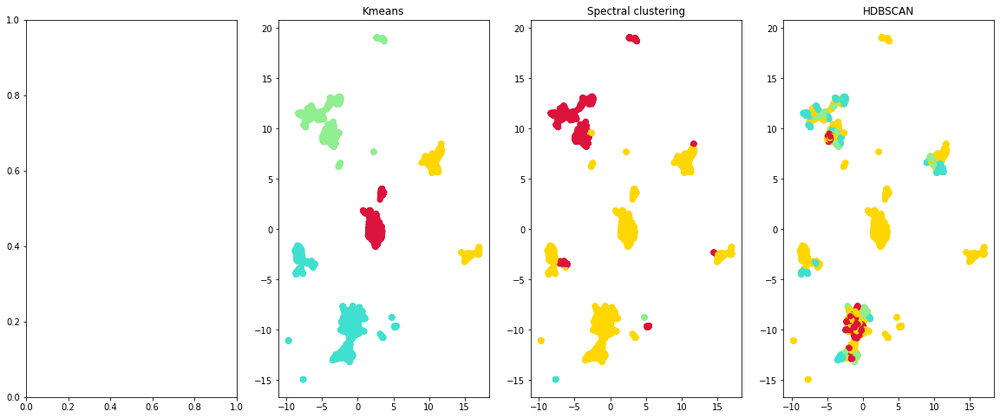

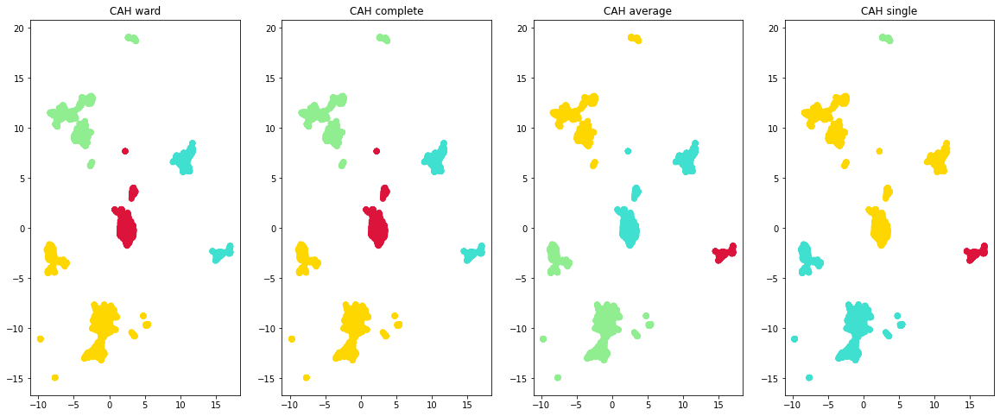

In [ ]:
eval_clustering_7(X_reduced_UMAP ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels}

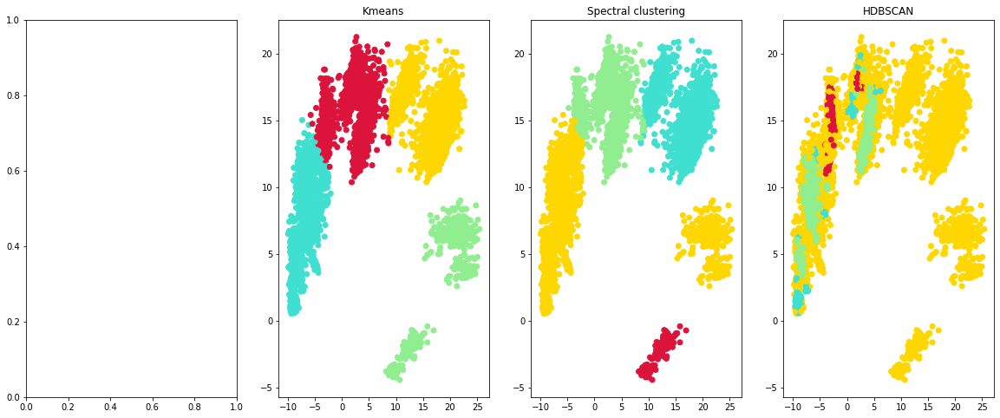

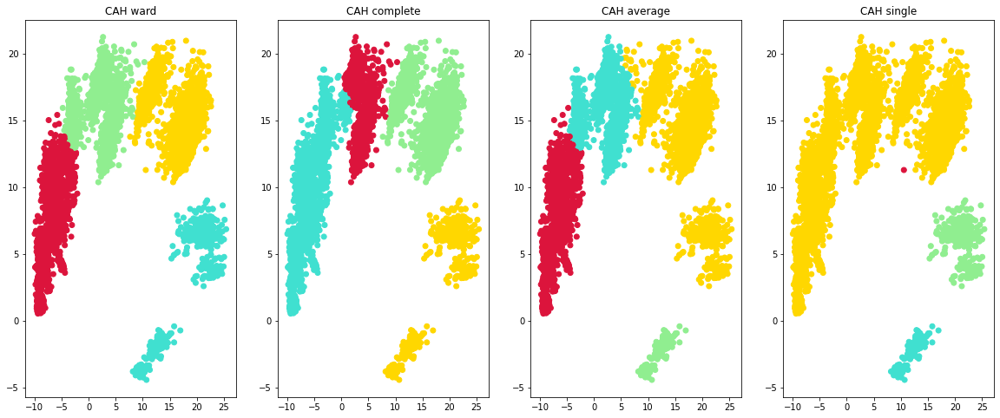

In [ ]:
eval_clustering_7(X_reduced_autoencoder ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [02:44<00:00,  3.29s/it]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels}

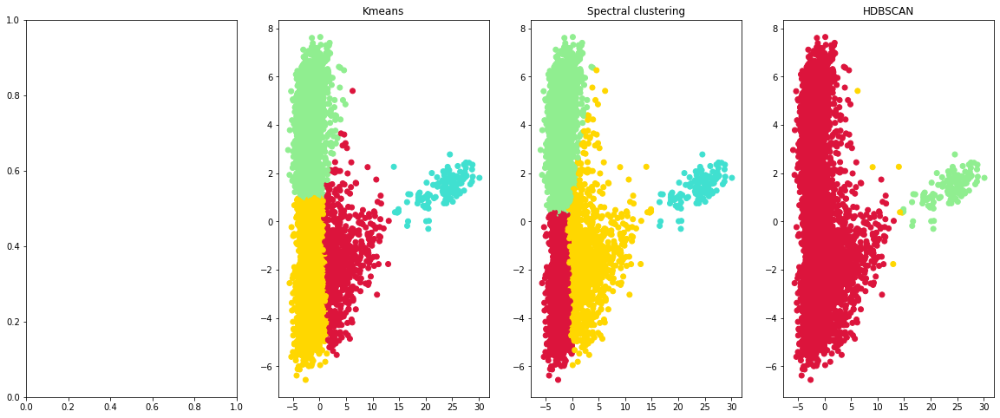

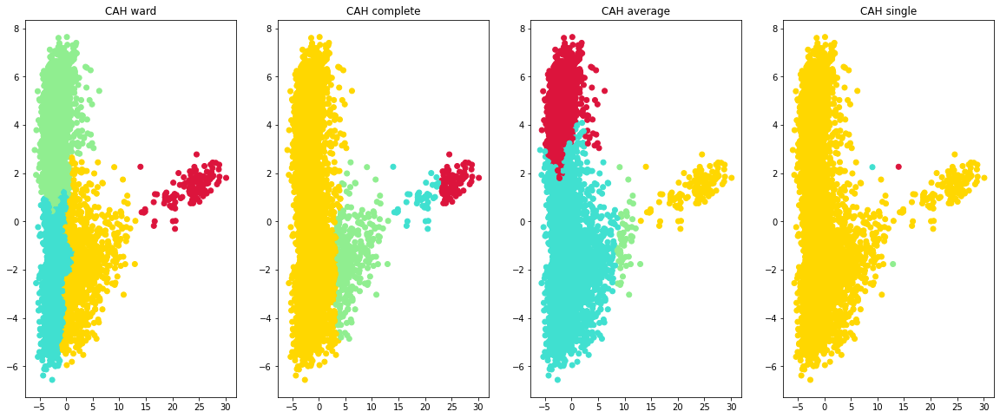

In [ ]:
eval_clustering_7(X_reduced_PCA ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels}

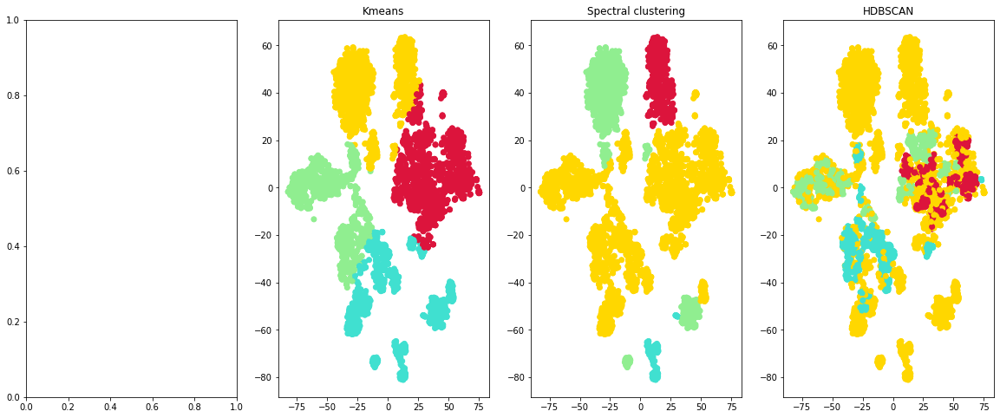

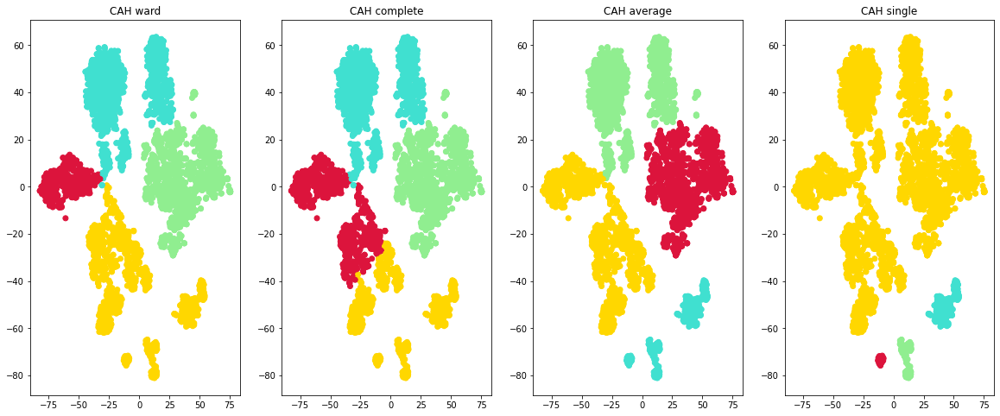

In [ ]:
eval_clustering_7(X_reduced_TSNE ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels}

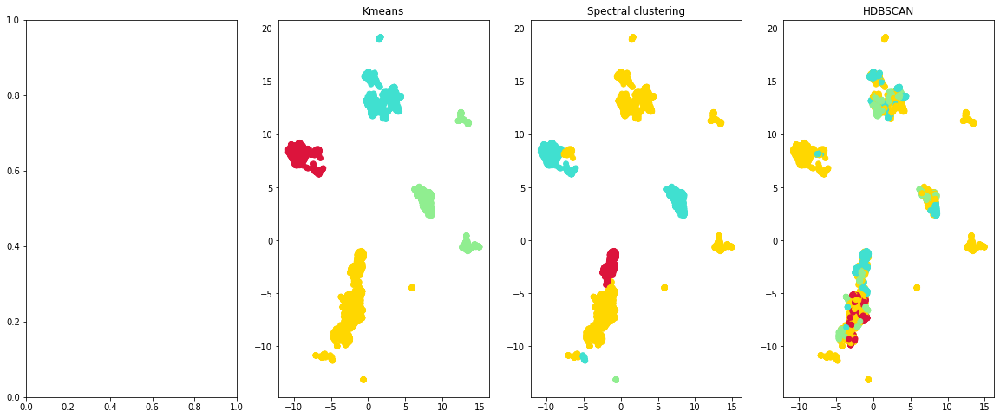

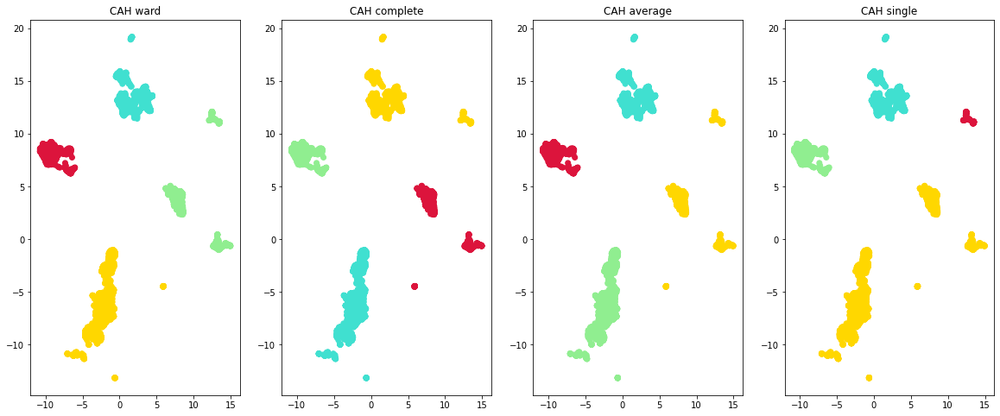

In [ ]:
eval_clustering_7(X_reduced_UMAP ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels}

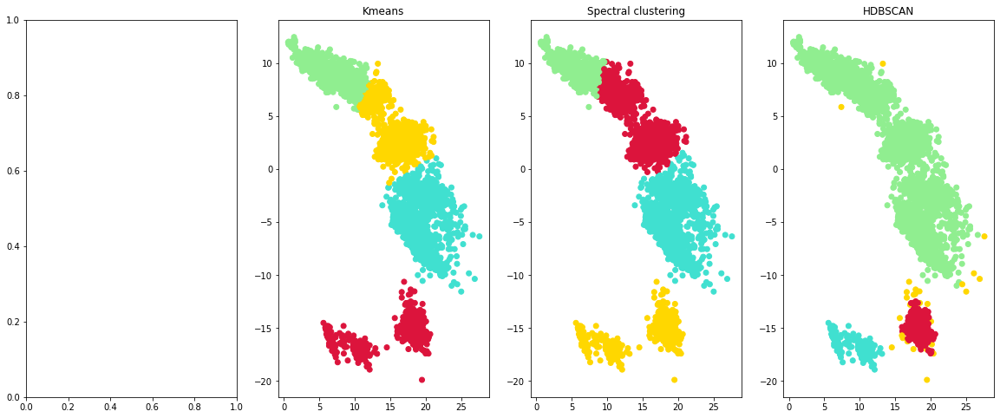

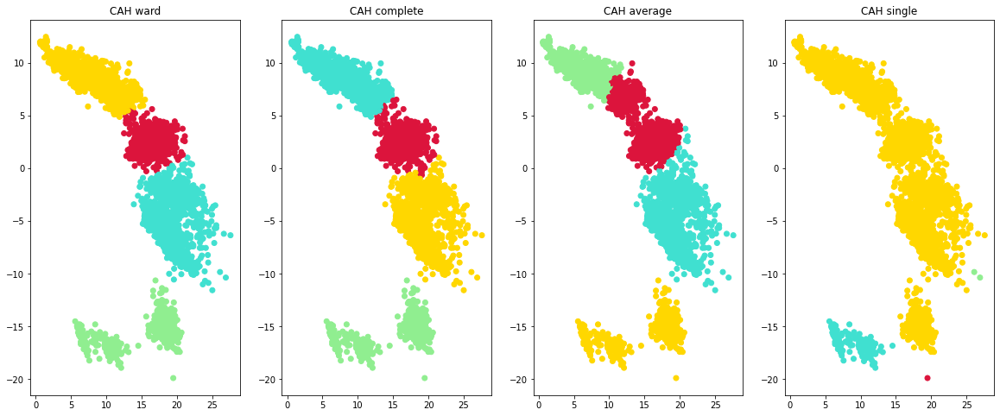

In [ ]:
eval_clustering_7(X_reduced_autoencoder ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Méthodes combinées

### BERT

In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
import  hdbscan
from sklearn.cluster import AgglomerativeClustering

import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

In [ ]:
#Define an accuracy function

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)


def accuracy(true_row_labels, predicted_row_labels):
    """Get the best accuracy.

    Parameters
    ----------
    true_row_labels: array-like
        The true row labels, given as external information
    predicted_row_labels: array-like
        The row labels predicted by the model

    Returns
    -------
    float
        Best value of accuracy
    """

    cm = confusion_matrix(true_row_labels, predicted_row_labels)
    indexes = linear_sum_assignment(_make_cost_m(cm))
    total = 0
    for row, column in zip(*indexes):
        value = cm[row][column]
        total += value

    return round(total * 1. / np.sum(cm),2)

In [ ]:
def eval_clustering_7(X_reduced, model1, model2, model3, model4, model5, model6, model7, title0, title1, title2, title3, title4,
                      title5, title6,title7):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1)

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model2["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title2)

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model3["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title3)

    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model4["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title4)

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model5["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title5)

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model6["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title6)

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model7["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title7)

In [ ]:
X=bert_embeddings_concat

In [ ]:
!pip install rpy2

In [ ]:
import rpy2.robjects.numpy2ri
rpy2.robjects.numpy2ri.activate()

In [ ]:
from rpy2.robjects.packages import importr
utils= importr('utils')

In [ ]:
utils.install_packages('FCPS', repos="https://cloud.r-project.org")

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘plyr’, ‘sp’, ‘pracma’, ‘reshape2’, ‘RcppArmadillo’, ‘mclust’, ‘DataVisualizations’


R[write to console]: trying URL 'https://cloud.r-project.org/src/contrib/plyr_1.8.6.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 401191 bytes (391 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[wr

<rpy2.rinterface_lib.sexp.NULLType object at 0x7f1114219910> [RTYPES.NILSXP]

In [ ]:
fcps=importr('FCPS')

In [ ]:
utils.install_packages('clustrd')

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘RcppEigen’, ‘modeltools’, ‘DEoptimR’, ‘RSpectra’, ‘reshape’, ‘flexmix’, ‘prabclus’, ‘diptest’, ‘robustbase’, ‘kernlab’, ‘rARPACK’, ‘corpcor’, ‘GGally’, ‘fpc’, ‘ggrepel’, ‘ca’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/RcppEigen_0.3.3.9.1.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 1633360 bytes (1.6 MB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]:

<rpy2.rinterface_lib.sexp.NULLType object at 0x7f1114219910> [RTYPES.NILSXP]

In [ ]:
def eval_clustering_2(X_reduced, model1,  title0, title1):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1)

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels}

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



  |======================================================================| 100%

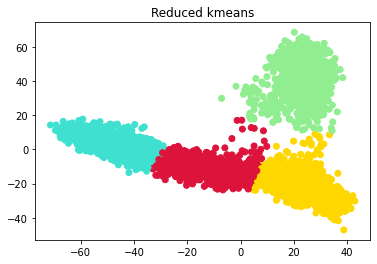

In [ ]:
eval_clustering_2(X_reduced_rkm ,rkm, "True labels","Reduced kmeans")

> #### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels}

  |======================================================================| 100%

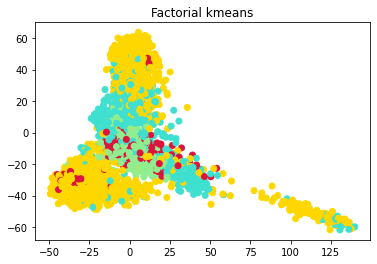

In [ ]:
eval_clustering_2(X_reduced_fkm ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
import os
import math
import tensorflow.compat.v1 as tf
from tqdm import tqdm

In [ ]:
"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})

        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]

    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [05:35<00:00,  6.71s/it]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [05:43<00:00,  6.86s/it]


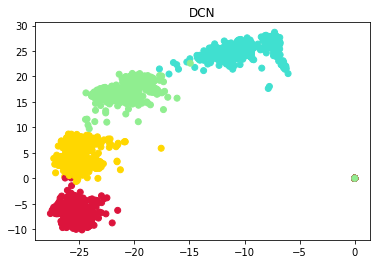

In [ ]:
eval_clustering_2(X_reduced_dcn ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [05:28<00:00,  6.57s/it]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [11:04<00:00, 33.22s/it]


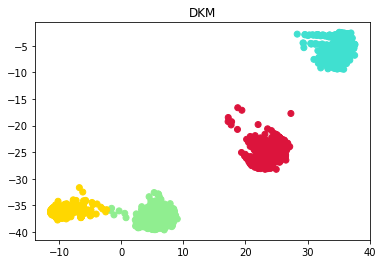

In [ ]:
eval_clustering_2(X_reduced_dkm ,dkm, "True labels","DKM")

### RoBERTa

In [ ]:
X=roberta_embeddings_concat

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels}

  |=====================                                                 |  30%

From cffi callback <function _processevents at 0x7f1118750b90>:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/rpy2/rinterface_lib/callbacks.py", line 274, in _processevents
    @ffi_proxy.callback(ffi_proxy._processevents_def,
KeyboardInterrupt
From cffi callback <function _processevents at 0x7f1118750b90>:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/rpy2/rinterface_lib/callbacks.py", line 274, in _processevents
    @ffi_proxy.callback(ffi_proxy._processevents_def,
KeyboardInterrupt
From cffi callback <function _processevents at 0x7f1118750b90>:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/rpy2/rinterface_lib/callbacks.py", line 274, in _processevents
    @ffi_proxy.callback(ffi_proxy._processevents_def,
KeyboardInterrupt


In [ ]:
eval_clustering_2(X_reduced_rkm ,rkm, "True labels","Reduced kmeans")

>#### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels}

In [ ]:
eval_clustering_2(X_reduced_fkm, labels_int ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels}

In [ ]:
eval_clustering_2(X_reduced_dcn ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels = dkm_model[1]
X_reduced_dkm = dkm_model[0]

dkm = {"labels": dkm_pred_labels}


In [ ]:
eval_clustering_2(X_reduced_dkm ,dkm, "True labels","DKM")